In [370]:
import numpy as np
from sklearn.datasets import make_circles
import matplotlib.pyplot as plt
import networkx as nx

# Functions

In [371]:
# def make_circles(n_samples = 2000, noise = 0.05, seed = 7):
#     rng = np.random.default_rng(seed)
#     n = n_samples // 2
#     t = rng.uniform(0, 2 * np.pi, n)
#     outer = np.stack([np.cos(t), np.sin(t)], axis = 1)
#     inner = 0.5 * np.stack([np.cos(t), np.sin(t)], axis = 1)
#     X = np.vstack([outer, inner])
#     X += rng.normal(0, noise, X.shape)
#
#     return X

In [372]:
def distancia_euclidiana(X: np.ndarray, y: np.ndarray) -> np.ndarray:
    return np.sqrt(
        np.sum(
            (X - y) ** 2
            )
        )

In [373]:
def update_peso(first: int, dot: np.ndarray) -> None:

    peso_atual = G.nodes()[first]["pos"]

    G.nodes()[first]["pos"] = peso_atual + eps_b * (dot - peso_atual)

    # Erro quadratico, adiciona
    G.nodes()[first]["erro"] += np.sum((dot - peso_atual) ** 2)

In [374]:
def update_neighbors(first: int, dot: np.ndarray) -> None:

    for neuron in G.neighbors(first):

        peso_atual = G.nodes()[neuron]["pos"]

        peso = peso_atual + eps_n * (dot - peso_atual)

        G.nodes()[neuron]["pos"] = peso

In [375]:
def old_edges(first: int, second: int) -> None:

    neighbors = list(G.neighbors(first))

    for neuron in neighbors:

        if neuron == second:
            G.edges[first, neuron]["idade"] = 0
        else:
            G.edges[first, neuron]["idade"] += 1

        # Remove this edge if it is older than the limit
        if G.edges[first, neuron]["idade"] >= max_age:

            G.remove_edge(first, neuron)

            print(f"Edge {first} - {neuron} removed")

    # Remove isolated nodes
    if not G.neighbors(first):
        G.remove_node(first)

        print(f"Node {first} removed")

    for neuron in G.neighbors(first):
        if not G.neighbors(neuron):
            G.remove_node(neuron)

            print(f"Node {neuron} removed")

In [376]:
def _add_edge(first: int, second: int, idade: int =1) -> None:

    if not G.has_edge(first, second):
        G.add_edge(first, second, idade = idade)

        print(f"New edge {first} - {second} added")

    old_edges(first, second)

In [377]:
def calc_distance_from_nodes(dot: np.ndarray) -> list:

    """Gets the distance from every node to the point"""

    distances = {}

    for n in G.nodes():

        distances[n] = distancia_euclidiana(G.nodes()[n]["pos"], dot)

    distances = sorted(distances.items(), key=lambda x: x[1])

    return distances

In [378]:
def get_worst_neuron() -> int:

    erros = {}

    # TODO: I can use adj, but I don't think it makes too much difference
    for n in G.nodes():

        erros[n] = G.nodes()[n]["erro"]

    # print(erros)

    erros = sorted(erros.items(), key=lambda x: x[1], reverse = True)

    return erros[0][0]


    # erros = dict(G.nodes.data()) # TODO: sort G.nodes directly
    #
    # erros = sorted(erros.items(), key=lambda x: x[1]["erro"], reverse=True)
    #
    # return erros[0]

In [379]:
def get_worst_neighbor(worst_neuron: int) -> int:

    erros = {}

    # TODO: I can use adj, but I don't think it makes too much difference
    for n in G.neighbors(worst_neuron):

        erros[n] = G.nodes()[n]["erro"]

    erros = sorted(erros.items(), key=lambda x: x[1], reverse = True)

    return erros[0][0]

In [380]:
def reduce_all_errors():
    for i in G.nodes:
        G.nodes()[i]["erro"] *= d

In [381]:
def reduce_worst_errors(worst, neighbor, new_node):

    G.nodes()[worst]["erro"] *= alpha

    G.nodes()[neighbor]["erro"] *= alpha

    G.nodes()[new_node]["erro"] = G.nodes()[worst]["erro"]

In [382]:
def adiciona_neuron():

    worst_neuron: int = get_worst_neuron()

    worst_neuron_w: np.ndarray = G.nodes()[worst_neuron]["pos"]

    worst_neighbor: int = get_worst_neighbor(worst_neuron)

    worst_neighbor_w: np.ndarray = G.nodes()[worst_neighbor]["pos"]

    new_neuron: np.ndarray = (worst_neuron_w + worst_neighbor_w) / 2

    last_node = G.order()

    new_node = last_node + 1

    G.add_node(new_node, pos=new_neuron, erro=0)

    print(f"Node {new_node} added")

    reduce_worst_errors(worst_neuron, worst_neighbor, new_node)

In [383]:
def plot_over_data(G, X, epoch = None):

    fig, ax = plt.subplots()

    plt.scatter(X[:, 0], X[:, 1], s = 2)

    pos = {i: G.nodes[i]["pos"] for i in G.nodes}
    nx.draw(G, pos, ax, font_size = 8, with_labels = True)

    title = "GNG over Data"

    if epoch:
        title += f" - {epoch} Epochs"
    else:
        ax.set_axis_on() # restore axes
        ax.set_aspect("equal")
        ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

    plt.title(title)

    plt.savefig(f"GNG_images/GNG_over_Data-{epoch if epoch else "final"}.png")

    plt.show()

# Data

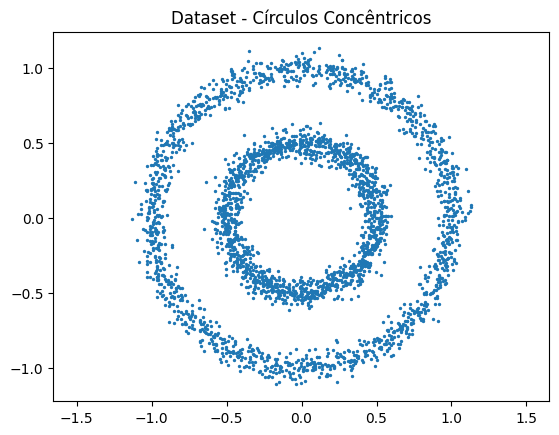

In [384]:
X, _ = make_circles(n_samples = 3000, factor = 0.5, noise = 0.05)
plt.scatter(X[:, 0], X[:, 1], s = 2)
plt.axis('equal')
plt.title("Dataset - Círculos Concêntricos")
plt.show()

# GNG

In [385]:
# Growing Neural Gas simples usando NetworkX (procedural)

# hiperparâmetros
max_nodes = 180
max_age = 70
lambda_steps = 120
eps_b = 0.06
eps_n = 0.008
alpha = 0.5
d = 0.996
seed = 11

Durante o treino do GNG:
* O algoritmo seleciona um ponto aleatório dos dados.
* Encontra os dois nós mais próximos (eps_b e eps_n controlam o movimento).
* Atualiza erros e envelhece conexões (max_age controla remoção).
* A cada lambda_steps passos, adiciona um novo nó (controlado por alpha e d).
* O crescimento para quando max_nodes é atingido

O aluno deve treinar o GNG sobre os dados X e visualizar o grafo final formado (nós e arestas) sobre o plano dos círculos

In [386]:
np.random.seed(seed)

New edge 1 - 2 added
//////////



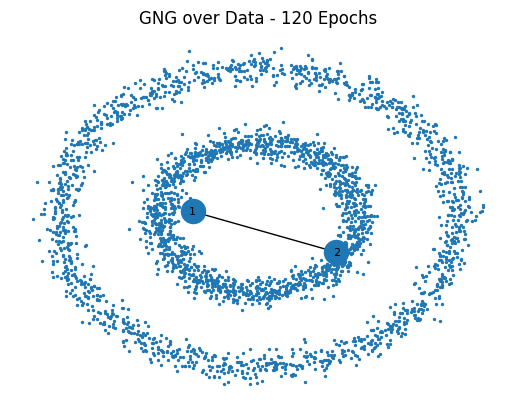

Node 3 added
New edge 1 - 3 added
New edge 3 - 2 added
//////////



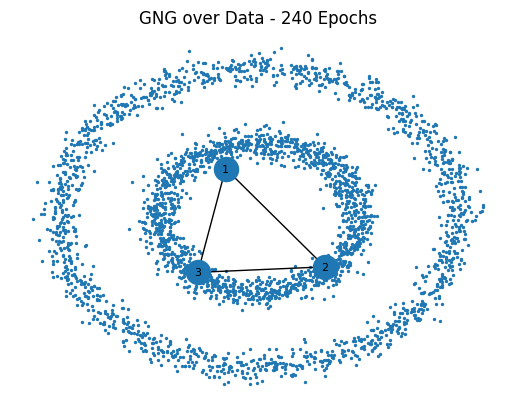

Node 4 added
New edge 1 - 4 added
New edge 3 - 4 added
//////////



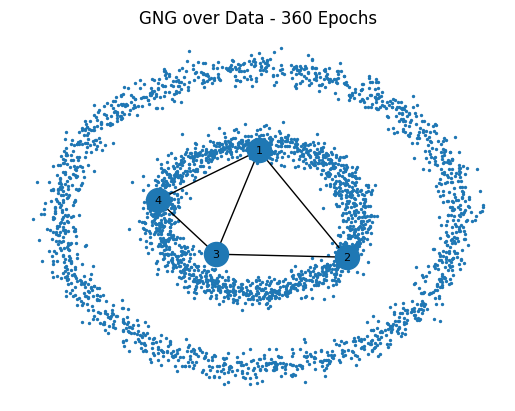

Node 5 added
New edge 5 - 2 added
New edge 1 - 5 added
Edge 3 - 1 removed
//////////



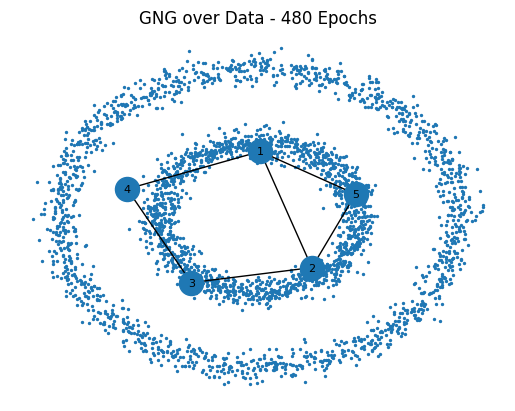

Node 6 added
New edge 4 - 6 added
New edge 1 - 6 added
Edge 2 - 1 removed
//////////



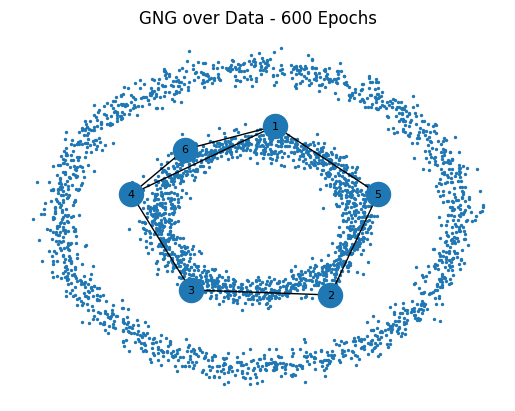

Node 7 added
New edge 7 - 5 added
New edge 7 - 2 added
Edge 1 - 4 removed
//////////



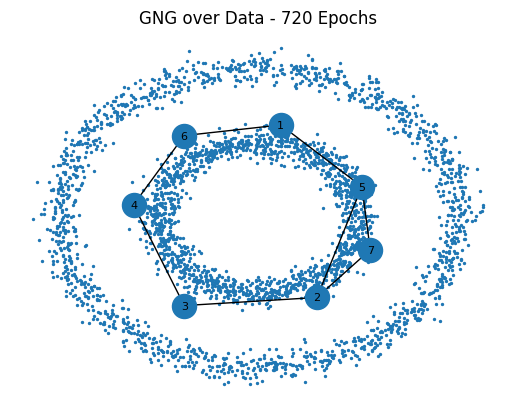

Node 8 added
New edge 8 - 4 added
New edge 3 - 8 added
//////////



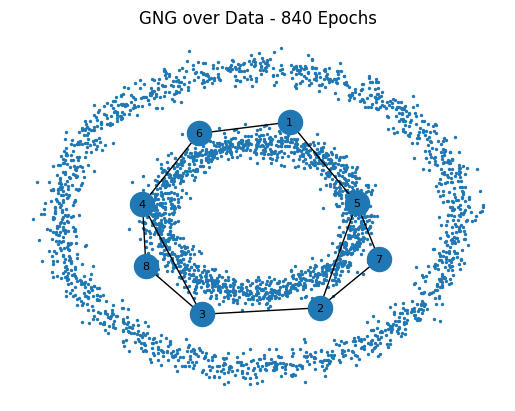

Node 9 added
New edge 2 - 9 added
Edge 2 - 5 removed
New edge 7 - 9 added
//////////



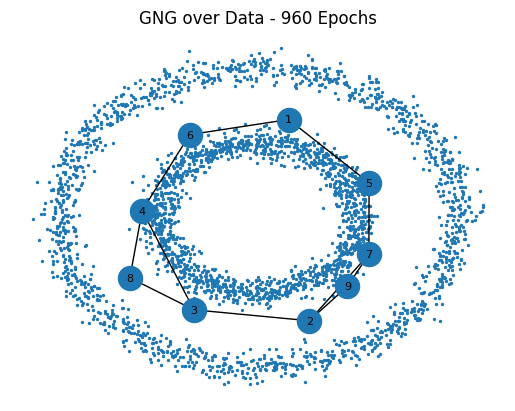

Node 10 added
New edge 10 - 1 added
Edge 4 - 3 removed
New edge 6 - 10 added
//////////



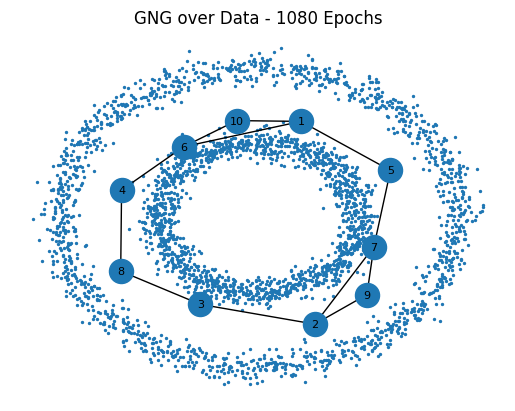

Node 11 added
New edge 11 - 8 added
New edge 11 - 4 added
//////////



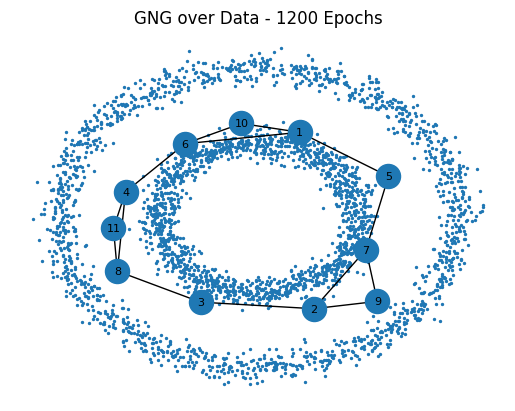

Node 12 added
New edge 12 - 5 added
New edge 12 - 1 added
Edge 6 - 1 removed
//////////



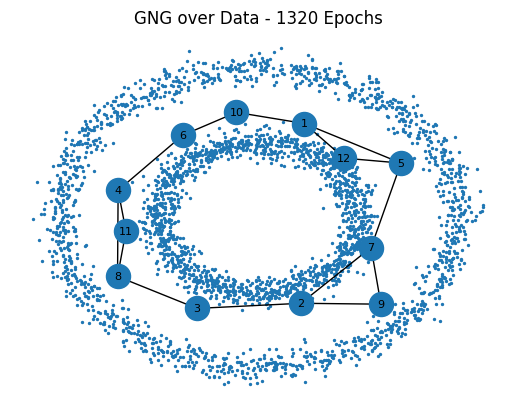

Node 13 added
New edge 2 - 13 added
New edge 13 - 3 added
New edge 7 - 12 added
New edge 11 - 3 added
//////////



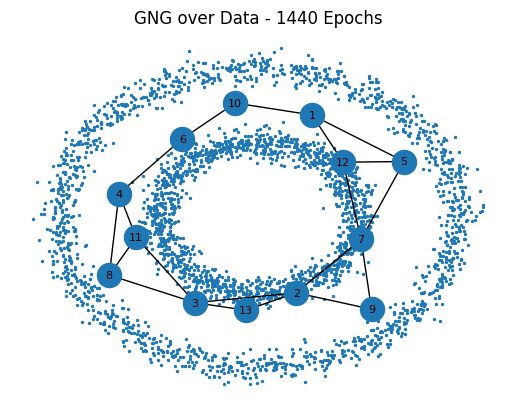

Node 14 added
New edge 6 - 14 added
New edge 14 - 10 added
New edge 11 - 6 added
//////////



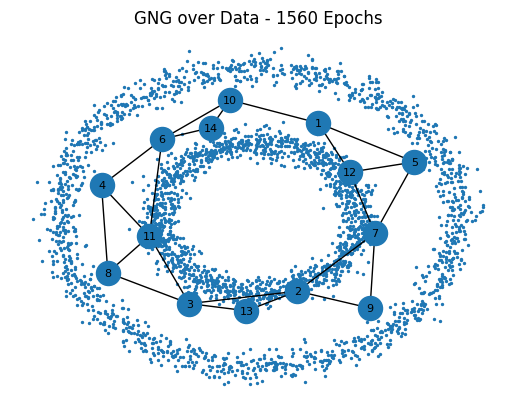

Node 15 added
New edge 15 - 6 added
New edge 11 - 15 added
New edge 15 - 4 added
New edge 9 - 13 added
New edge 14 - 1 added
//////////



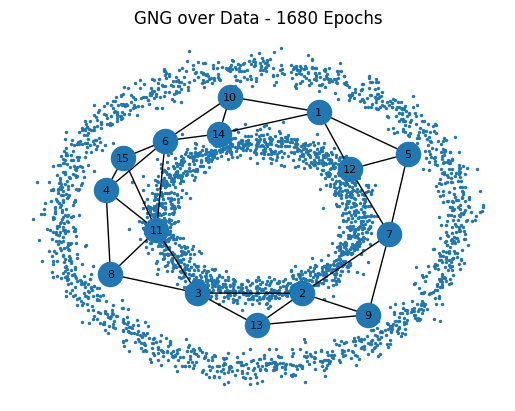

Node 16 added
New edge 13 - 16 added
New edge 16 - 2 added
New edge 16 - 3 added
Edge 2 - 3 removed
//////////



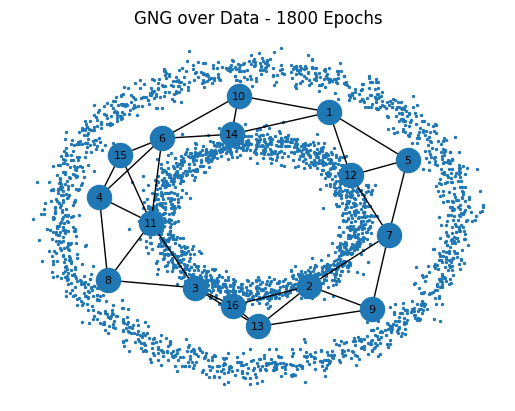

Node 17 added
New edge 12 - 17 added
New edge 17 - 7 added
New edge 5 - 17 added
//////////



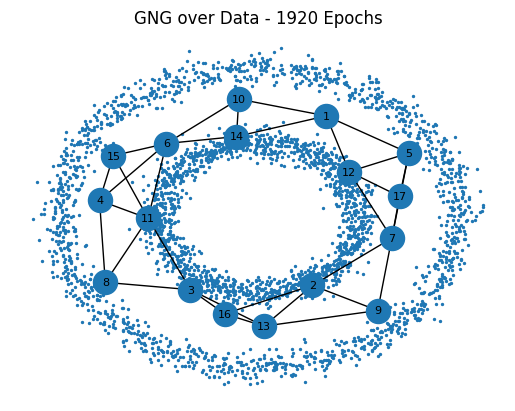

Node 18 added
New edge 13 - 18 added
New edge 16 - 18 added
New edge 2 - 18 added
//////////



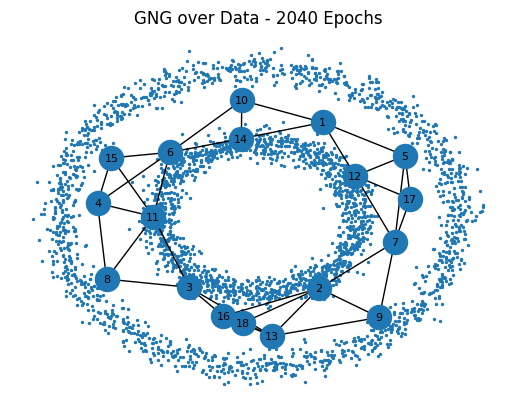

Node 19 added
New edge 19 - 1 added
New edge 12 - 19 added
New edge 5 - 19 added
//////////



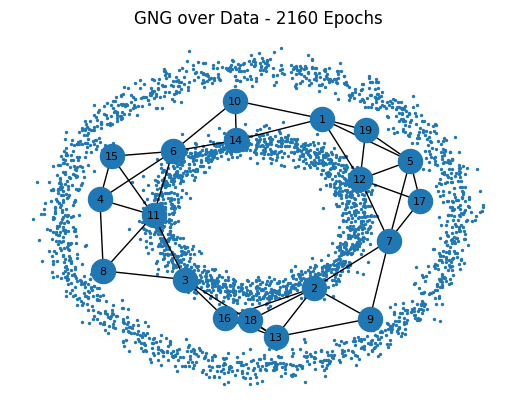

Node 20 added
New edge 15 - 20 added
New edge 6 - 20 added
New edge 10 - 20 added
Edge 4 - 6 removed
//////////



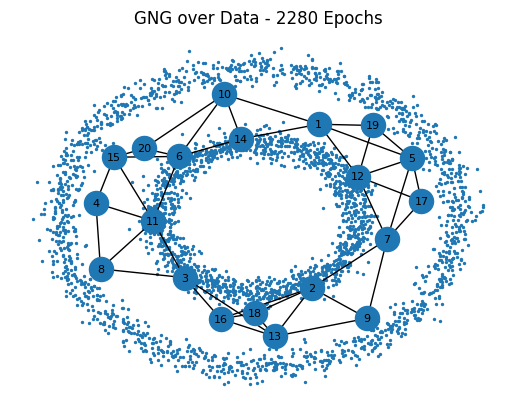

Node 21 added
New edge 10 - 21 added
New edge 14 - 21 added
Edge 11 - 15 removed
Edge 2 - 16 removed
New edge 21 - 1 added
Edge 13 - 3 removed
//////////



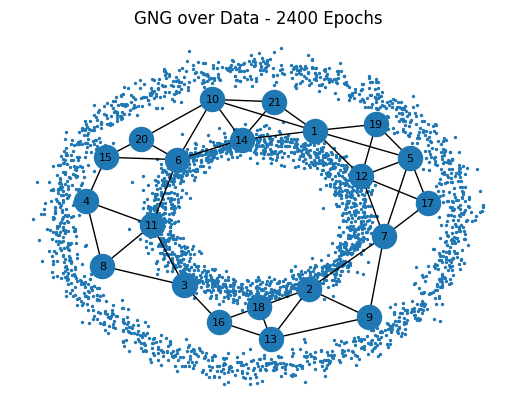

Node 22 added
New edge 3 - 18 added
New edge 16 - 22 added
New edge 13 - 22 added
New edge 18 - 22 added
//////////



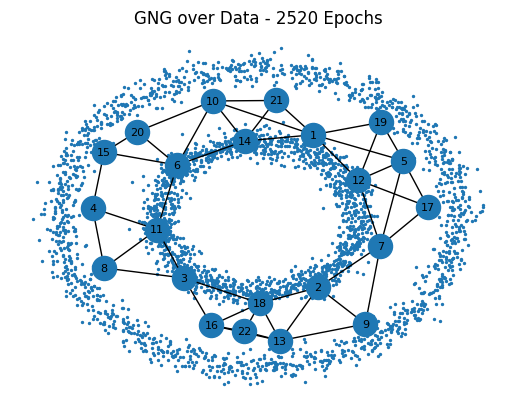

Node 23 added
New edge 23 - 7 added
New edge 2 - 23 added
New edge 9 - 23 added
Edge 5 - 7 removed
New edge 21 - 19 added
//////////



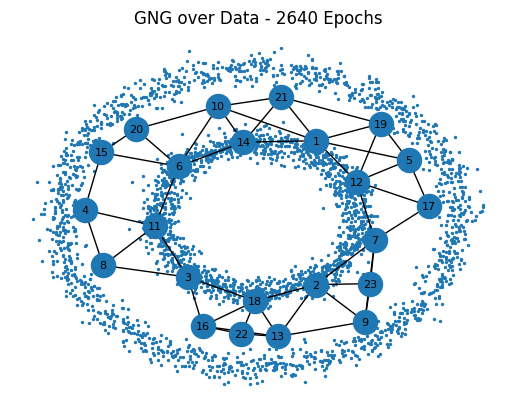

Node 24 added
New edge 21 - 24 added
New edge 8 - 16 added
New edge 1 - 24 added
New edge 17 - 23 added
//////////



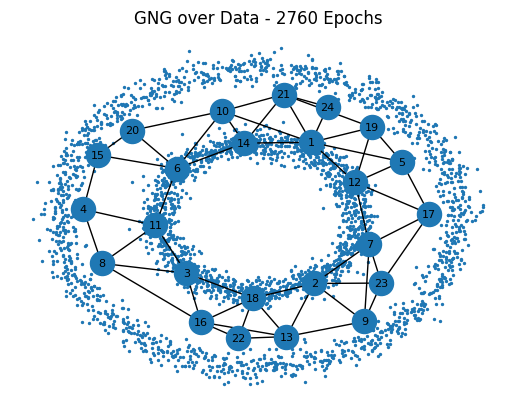

Node 25 added
New edge 25 - 17 added
New edge 24 - 19 added
Edge 12 - 17 removed
Edge 2 - 13 removed
New edge 25 - 23 added
Edge 19 - 12 removed
//////////



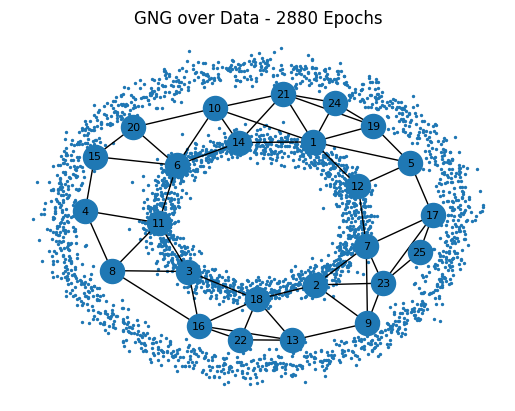

Node 26 added
New edge 26 - 8 added
New edge 26 - 16 added
Edge 1 - 5 removed
Edge 10 - 6 removed
//////////



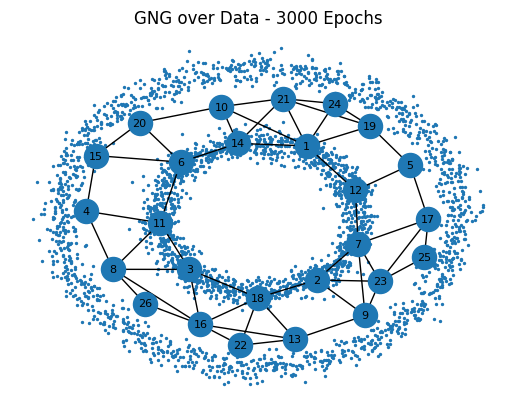

Node 27 added
New edge 10 - 27 added
New edge 6 - 27 added
New edge 20 - 27 added
New edge 3 - 26 added
Edge 1 - 10 removed
//////////



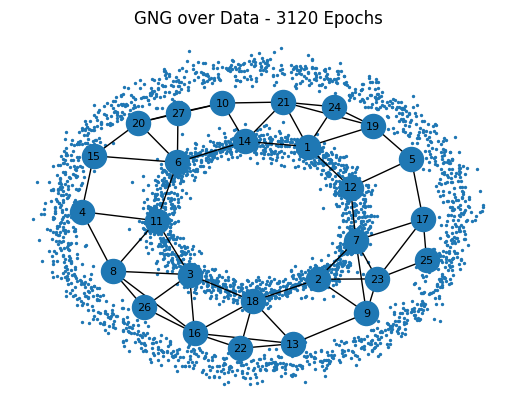

Node 28 added
Edge 9 - 2 removed
Edge 9 - 7 removed
New edge 14 - 27 added
//////////



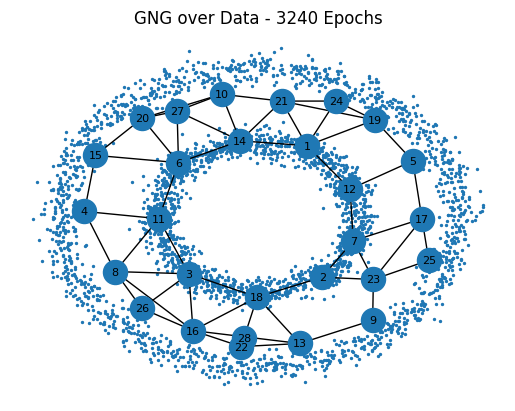

Node 29 added
New edge 18 - 28 added
New edge 29 - 13 added
New edge 29 - 9 added
New edge 22 - 28 added
//////////



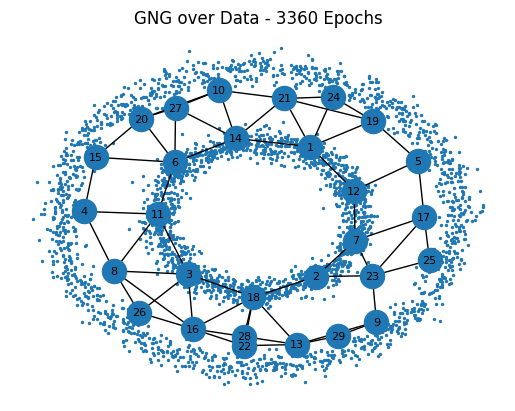

Node 30 added
Edge 15 - 6 removed
New edge 30 - 10 added
New edge 9 - 25 added
New edge 30 - 21 added
//////////



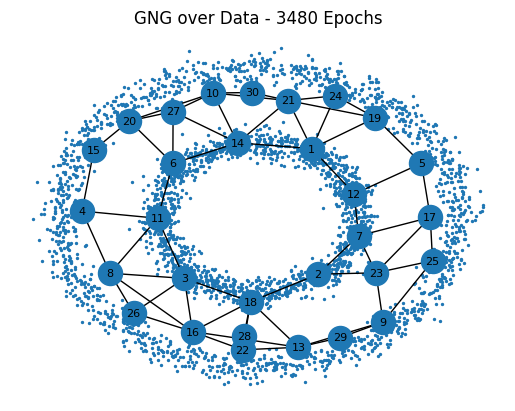

Node 31 added
New edge 8 - 31 added
New edge 26 - 31 added
New edge 14 - 30 added
Edge 16 - 13 removed
New edge 13 - 28 added
//////////



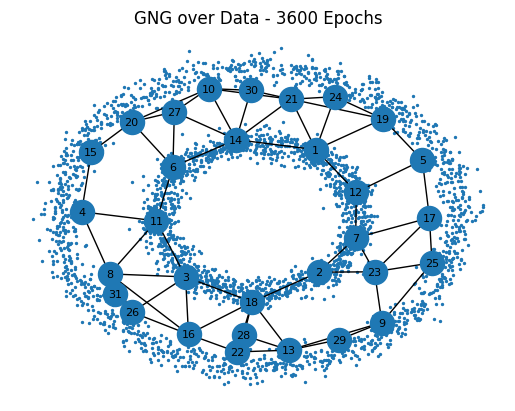

Node 32 added
New edge 3 - 31 added
New edge 32 - 19 added
New edge 32 - 5 added
Edge 18 - 22 removed
//////////



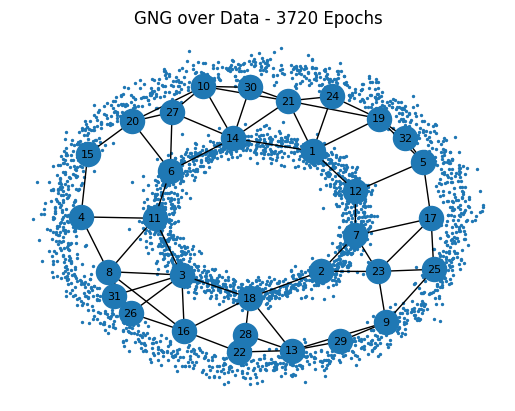

Node 33 added
New edge 3 - 33 added
//////////



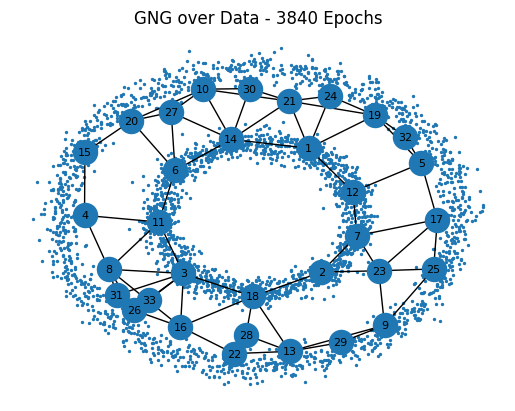

Node 34 added
New edge 34 - 25 added
Edge 18 - 13 removed
New edge 17 - 34 added
//////////



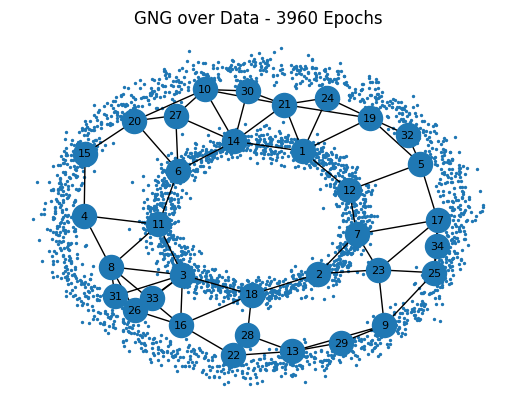

Node 35 added
New edge 8 - 35 added
Edge 17 - 7 removed
New edge 35 - 4 added
Edge 24 - 1 removed
New edge 11 - 35 added
New edge 26 - 33 added
Edge 10 - 14 removed
Edge 18 - 16 removed
//////////



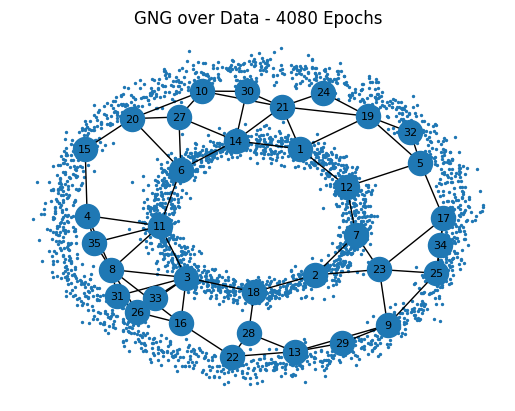

Node 36 added
Edge 10 - 20 removed
New edge 24 - 36 added
Edge 20 - 6 removed
//////////



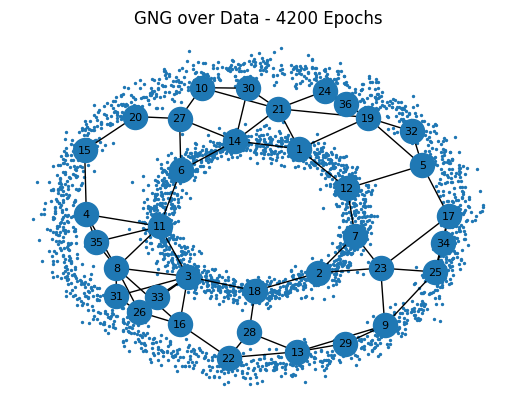

Node 37 added
New edge 10 - 20 added
Edge 9 - 13 removed
New edge 19 - 36 added
Edge 26 - 3 removed
New edge 11 - 37 added
New edge 24 - 30 added
Edge 19 - 1 removed
New edge 37 - 3 added
Edge 16 - 8 removed
//////////



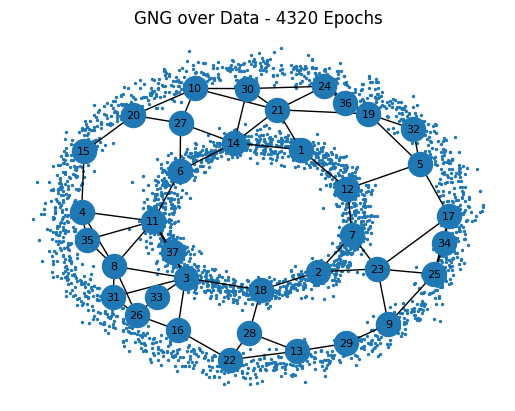

Node 38 added
New edge 38 - 22 added
Edge 3 - 16 removed
New edge 38 - 16 added
//////////



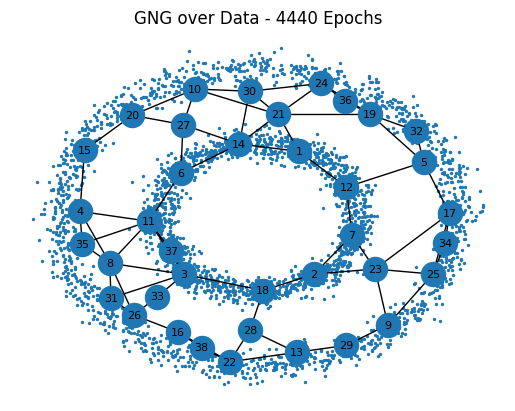

Node 39 added
New edge 4 - 39 added
Edge 3 - 31 removed
New edge 35 - 39 added
Edge 11 - 4 removed
Edge 19 - 21 removed
Edge 14 - 30 removed
//////////



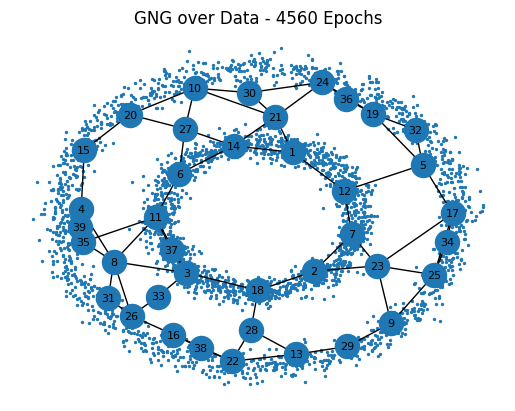

Node 40 added
New edge 1 - 40 added
New edge 40 - 14 added
New edge 35 - 31 added
New edge 21 - 40 added
//////////



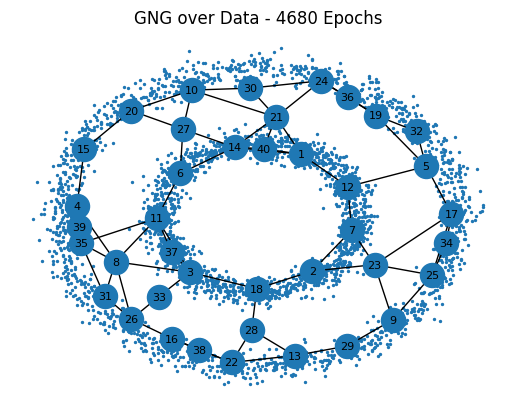

Node 41 added
New edge 12 - 41 added
New edge 41 - 7 added
Edge 3 - 8 removed
//////////



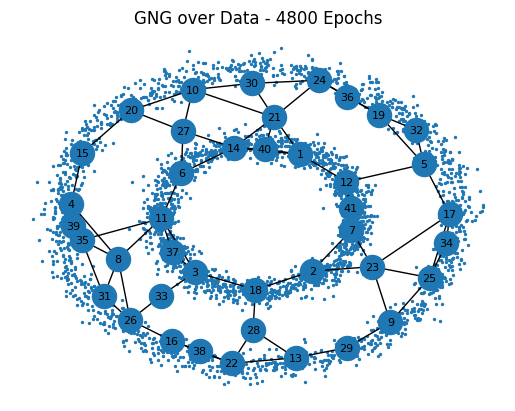

Node 42 added
New edge 42 - 10 added
New edge 37 - 8 added
Edge 12 - 5 removed
//////////



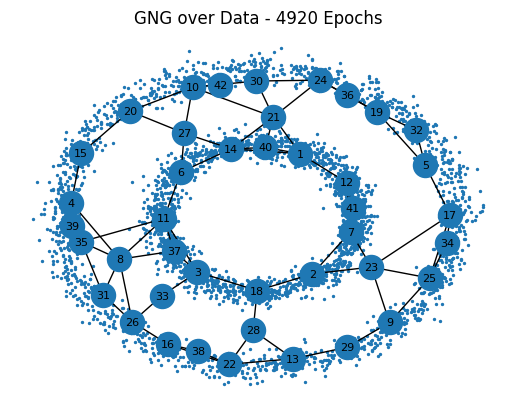

Node 43 added
New edge 11 - 43 added
New edge 6 - 43 added
Edge 11 - 3 removed
New edge 30 - 42 added
//////////



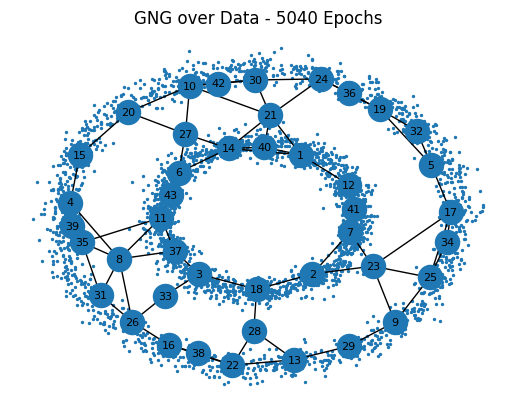

Node 44 added
New edge 44 - 25 added
New edge 9 - 44 added
Edge 11 - 35 removed
//////////



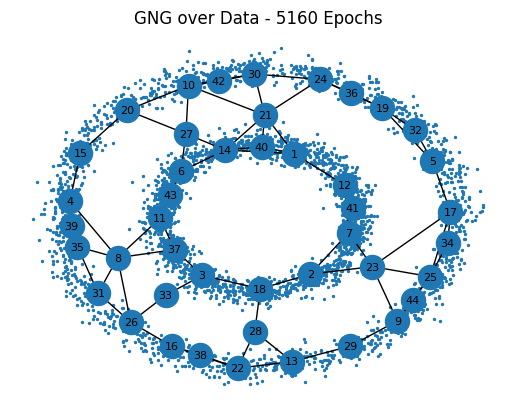

Node 45 added
New edge 2 - 45 added
New edge 45 - 18 added
Edge 11 - 8 removed
//////////



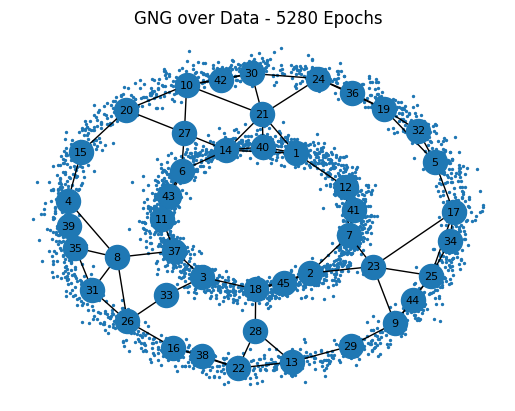

Node 46 added
New edge 46 - 20 added
Edge 17 - 23 removed
Edge 19 - 5 removed
New edge 46 - 10 added
//////////



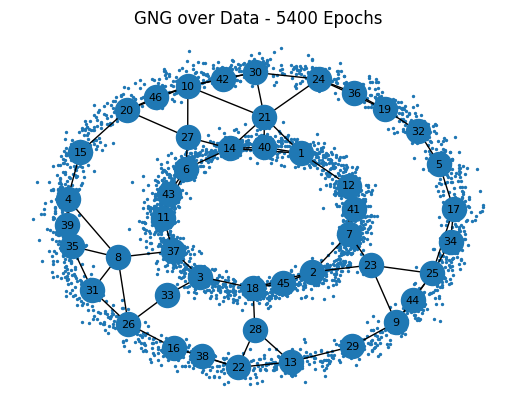

Node 47 added
New edge 1 - 47 added
Edge 1 - 14 removed
New edge 47 - 12 added
Edge 17 - 25 removed
//////////



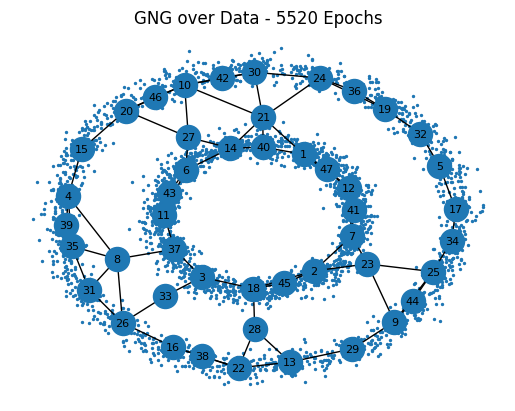

Node 48 added
New edge 48 - 31 added
New edge 26 - 48 added
Edge 12 - 7 removed
Edge 26 - 8 removed
Edge 24 - 19 removed
//////////



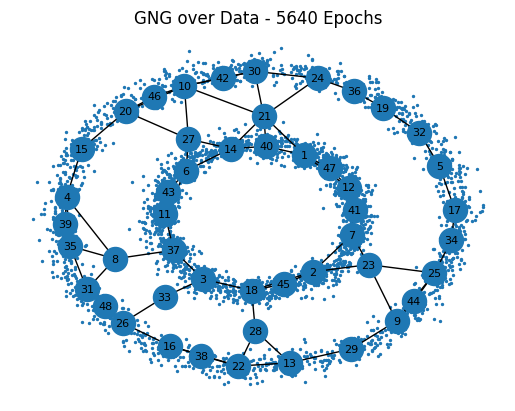

Node 49 added
New edge 18 - 49 added
Edge 16 - 22 removed
//////////



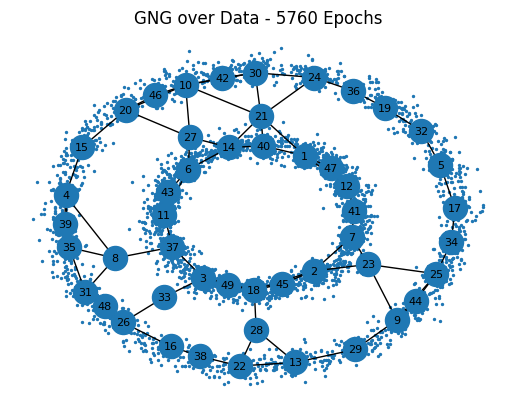

Node 50 added
New edge 11 - 50 added
New edge 49 - 3 added
New edge 37 - 50 added
//////////



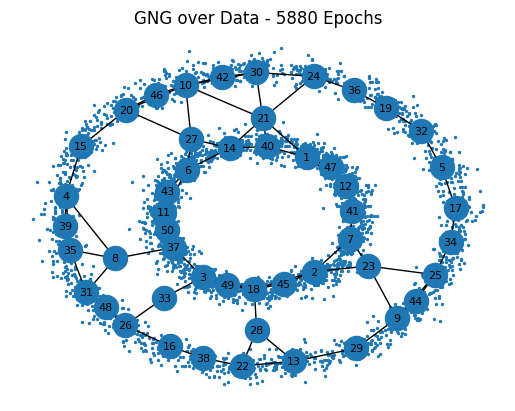

Node 51 added
New edge 40 - 51 added
New edge 14 - 51 added
//////////



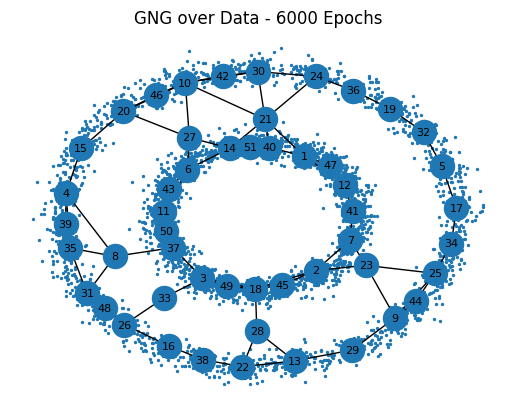

Node 52 added
New edge 21 - 51 added
Edge 10 - 21 removed
Edge 4 - 35 removed
New edge 15 - 52 added
//////////



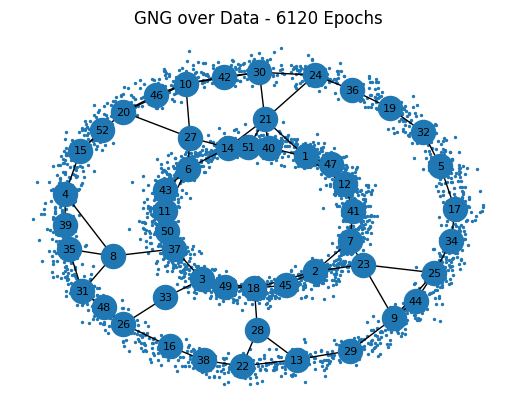

Node 53 added
New edge 52 - 20 added
New edge 30 - 53 added
New edge 24 - 53 added
Edge 2 - 18 removed
Edge 6 - 11 removed
//////////



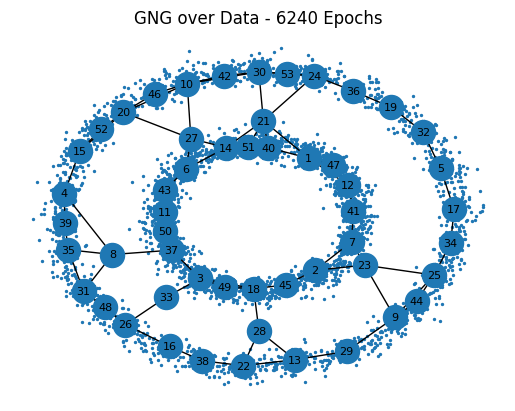

Node 54 added
New edge 13 - 54 added
New edge 29 - 54 added
//////////



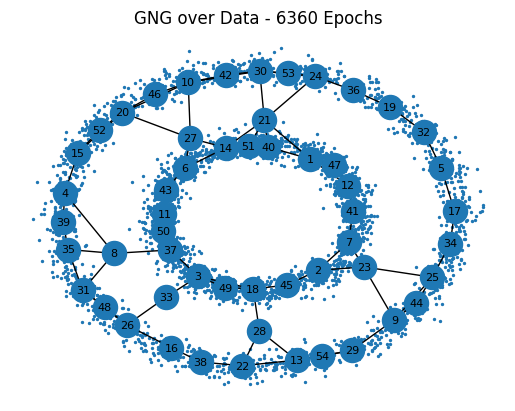

Node 55 added
New edge 55 - 37 added
New edge 55 - 3 added
//////////



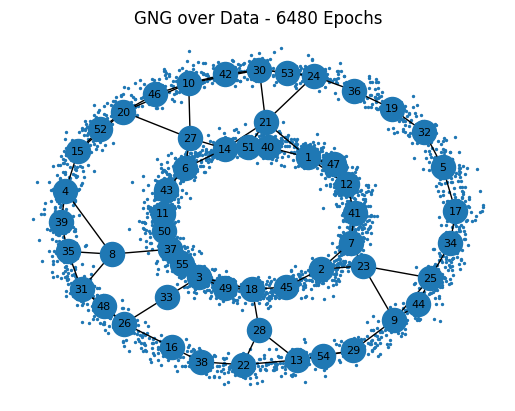

Node 56 added
New edge 31 - 56 added
New edge 48 - 56 added
Edge 12 - 1 removed
Edge 4 - 8 removed
//////////



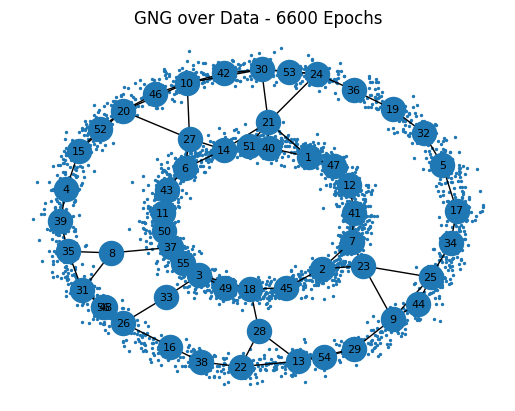

Node 57 added
Edge 10 - 30 removed
New edge 29 - 57 added
New edge 9 - 57 added
//////////



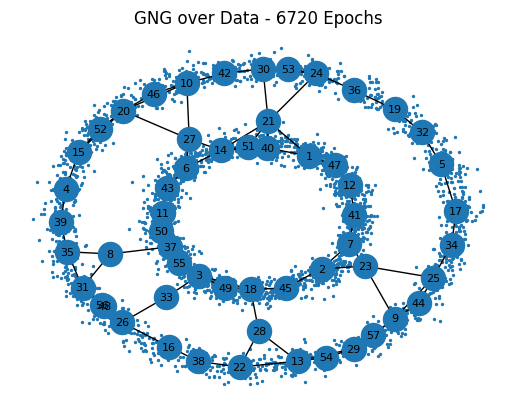

Node 58 added
New edge 27 - 58 added
New edge 14 - 58 added
Edge 23 - 9 removed
Edge 1 - 21 removed
New edge 6 - 58 added
//////////



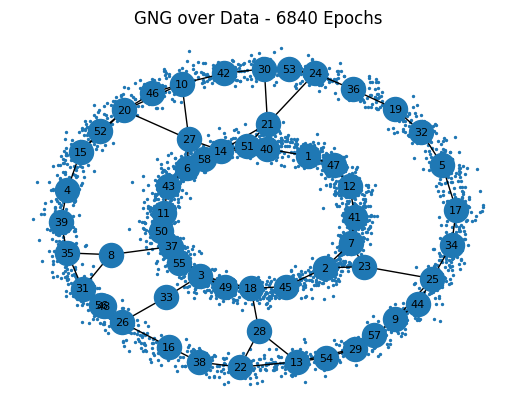

Node 59 added
Edge 24 - 21 removed
New edge 7 - 59 added
New edge 2 - 59 added
Edge 25 - 9 removed
//////////



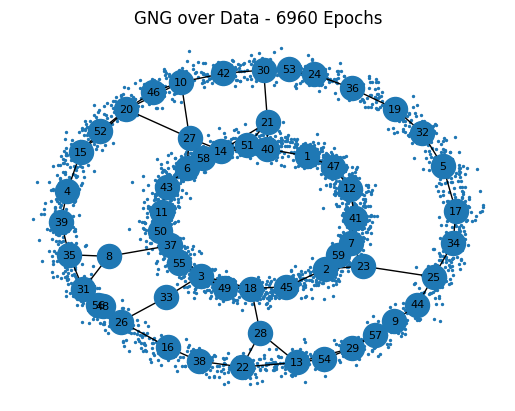

Node 60 added
New edge 46 - 60 added
New edge 10 - 60 added
//////////



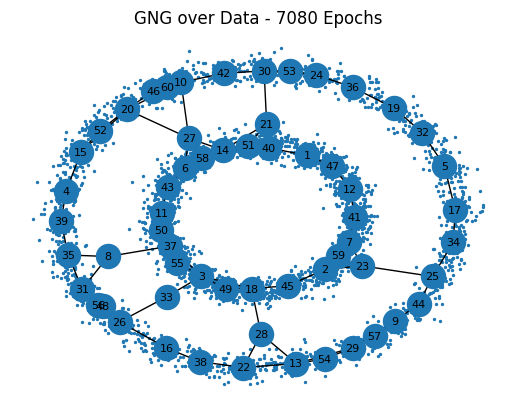

Node 61 added
Edge 18 - 3 removed
Edge 26 - 31 removed
Edge 37 - 11 removed
New edge 23 - 59 added
Edge 23 - 25 removed
New edge 35 - 61 added
//////////



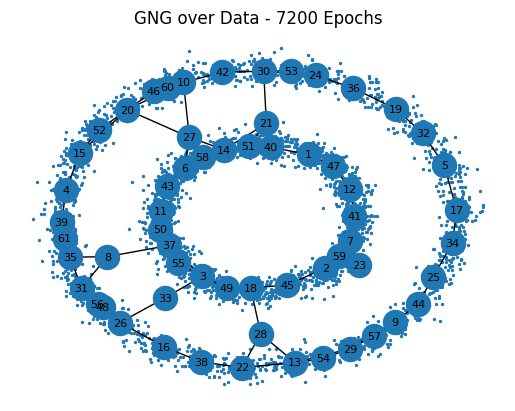

Node 62 added
New edge 13 - 62 added
New edge 61 - 39 added
Edge 40 - 14 removed
New edge 22 - 62 added
//////////



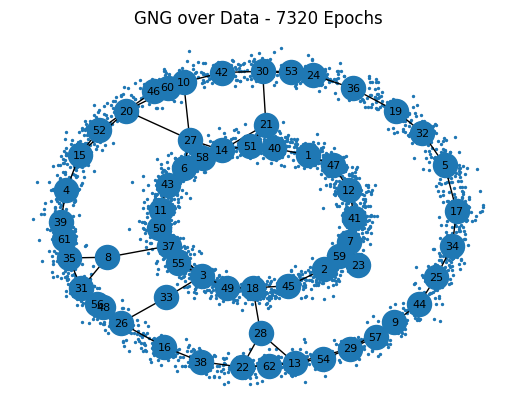

Node 63 added
New edge 63 - 1 added
New edge 63 - 40 added
Edge 21 - 14 removed
//////////



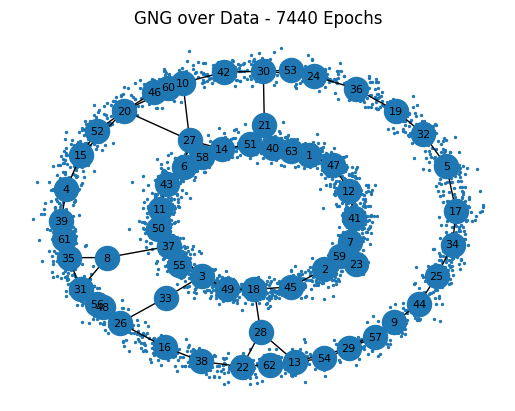

Node 64 added
New edge 18 - 64 added
New edge 62 - 28 added
New edge 45 - 64 added
//////////



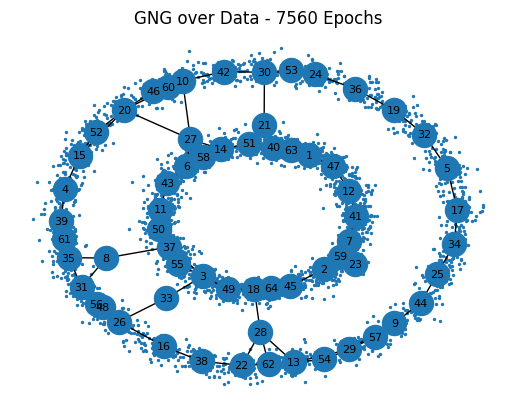

Node 65 added
Edge 20 - 10 removed
New edge 17 - 65 added
New edge 5 - 65 added
Edge 10 - 27 removed
//////////



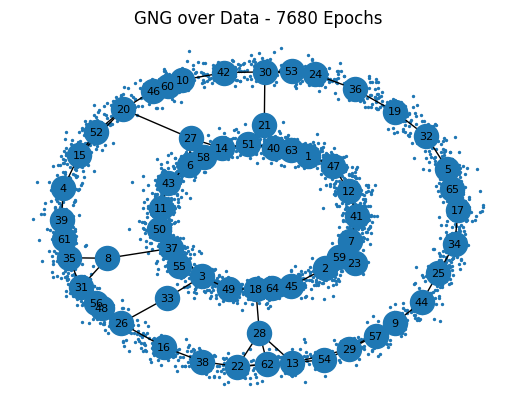

Node 66 added
New edge 41 - 66 added
Edge 30 - 21 removed
New edge 7 - 66 added
//////////



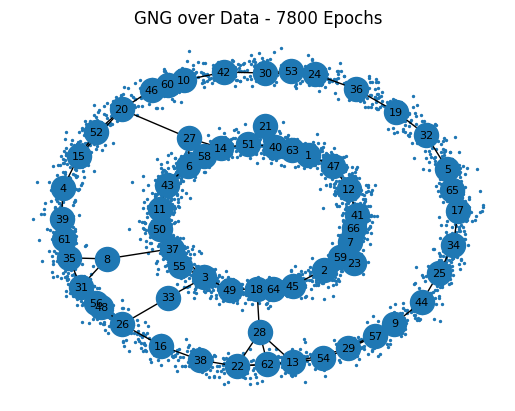

Node 67 added
New edge 67 - 38 added
New edge 16 - 67 added
//////////



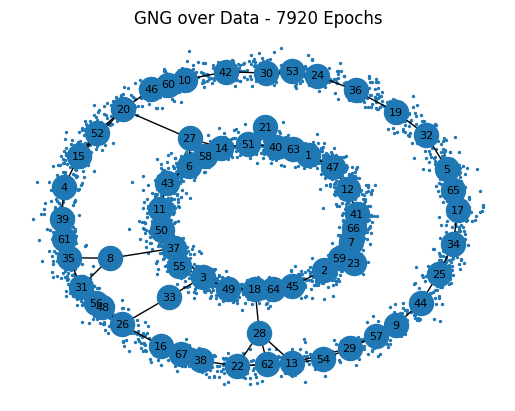

Node 68 added
Edge 18 - 28 removed
New edge 36 - 68 added
Edge 30 - 24 removed
//////////



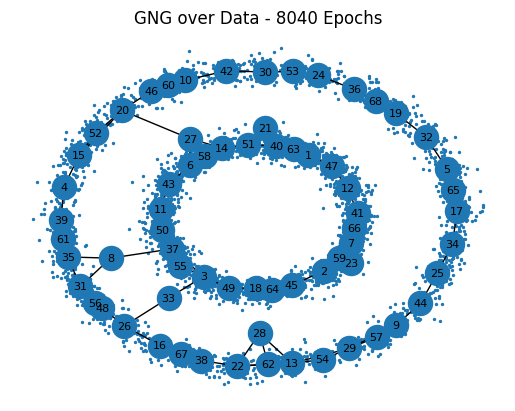

Node 69 added
Edge 6 - 14 removed
New edge 69 - 16 added
New edge 19 - 68 added
New edge 69 - 26 added
Edge 3 - 37 removed
//////////



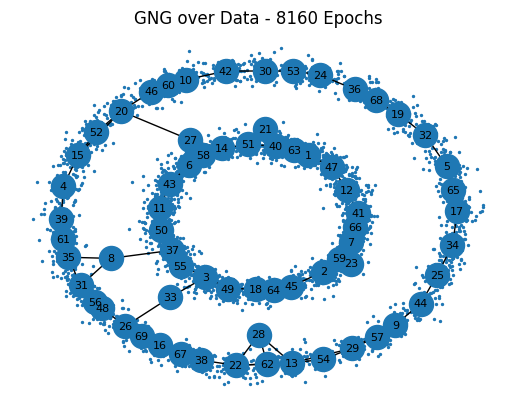

Node 70 added
New edge 5 - 70 added
Edge 20 - 27 removed
//////////



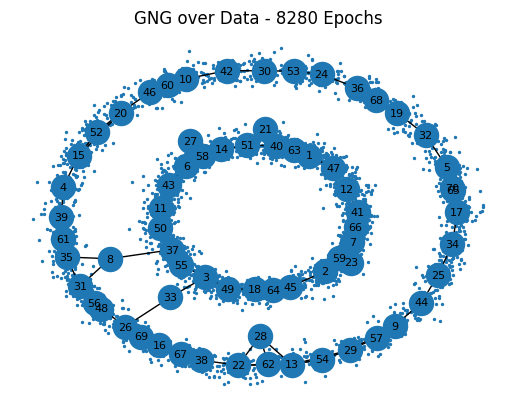

Node 71 added
New edge 47 - 71 added
New edge 12 - 71 added
New edge 70 - 65 added
//////////



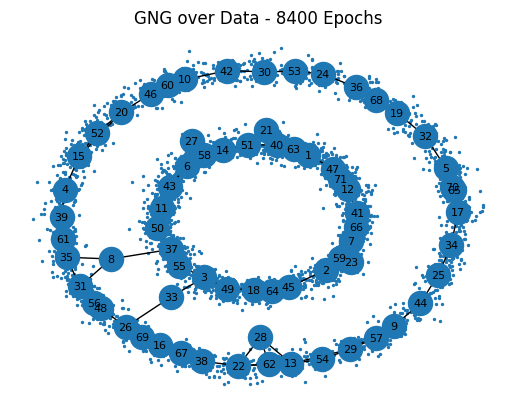

Node 72 added
Edge 2 - 7 removed
New edge 72 - 4 added
New edge 33 - 55 added
New edge 72 - 15 added
Edge 20 - 15 removed
//////////



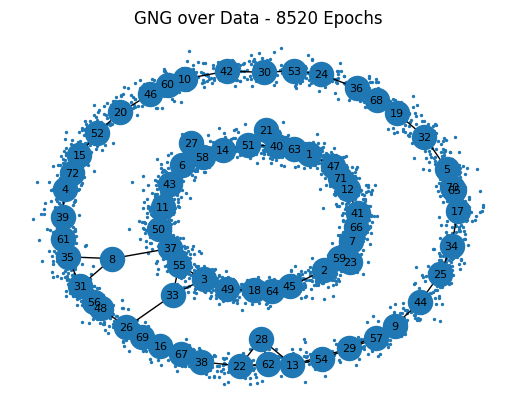

Node 73 added
New edge 43 - 73 added
New edge 50 - 8 added
Edge 13 - 29 removed
//////////



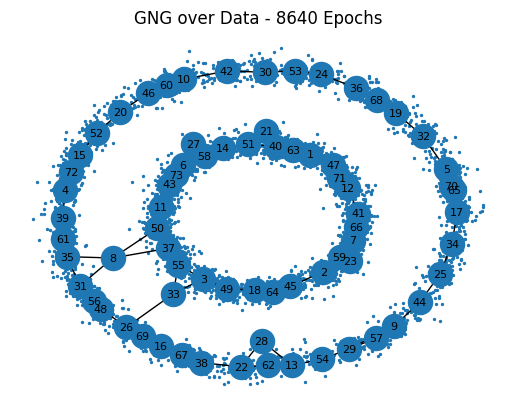

Node 74 added
New edge 6 - 73 added
New edge 74 - 11 added
New edge 50 - 74 added
//////////



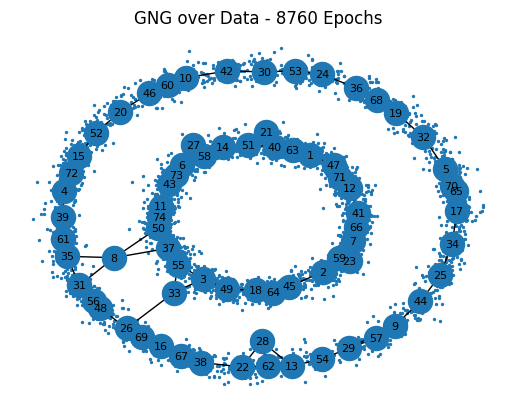

Node 75 added
New edge 60 - 75 added
//////////



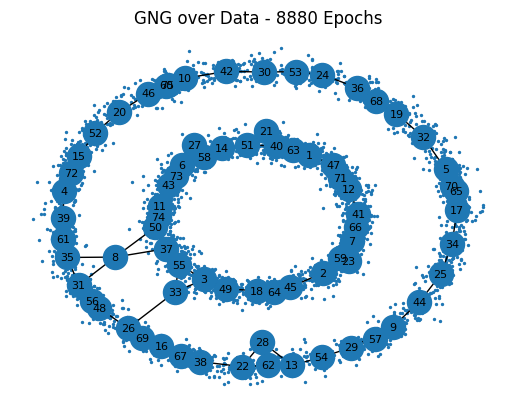

Node 76 added
New edge 10 - 75 added
New edge 37 - 76 added
Edge 18 - 45 removed
New edge 55 - 76 added
//////////



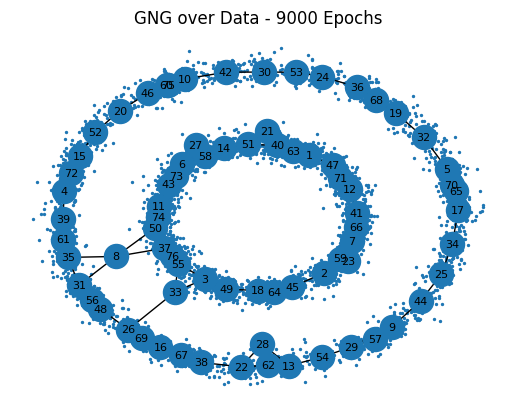

Node 77 added
New edge 22 - 77 added
New edge 77 - 62 added
Edge 40 - 1 removed
//////////



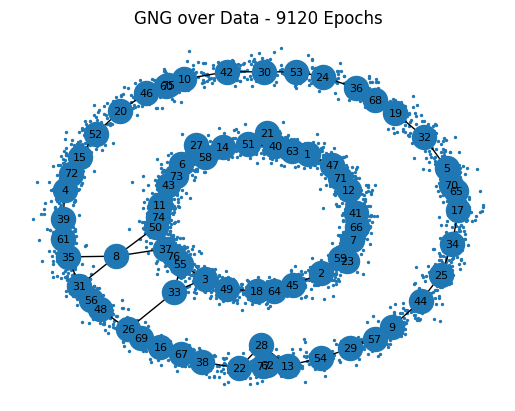

Node 78 added
New edge 28 - 78 added
Edge 29 - 9 removed
Edge 37 - 8 removed
New edge 22 - 78 added
//////////



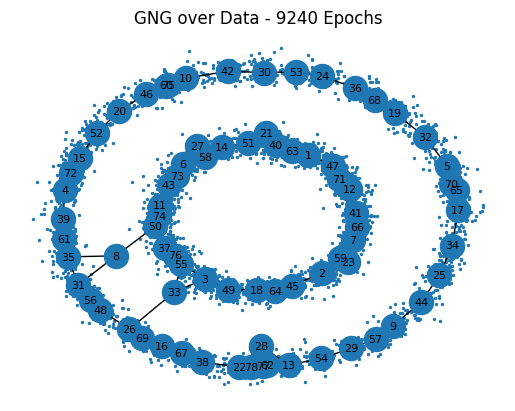

Node 79 added
New edge 79 - 25 added
//////////



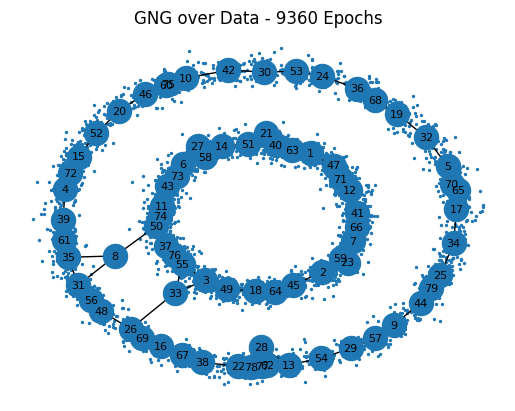

Node 80 added
New edge 17 - 80 added
New edge 79 - 44 added
New edge 80 - 34 added
Edge 41 - 7 removed
//////////



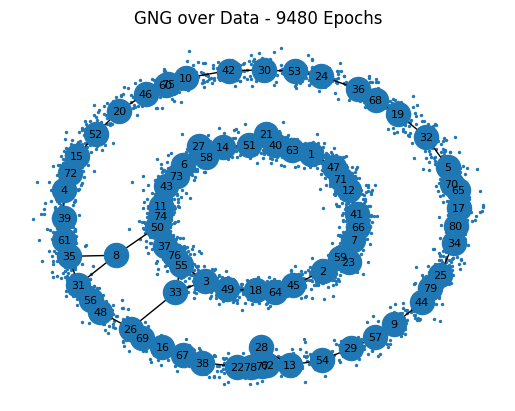

Node 81 added
New edge 13 - 81 added
Edge 13 - 22 removed
Edge 17 - 5 removed
New edge 54 - 81 added
//////////



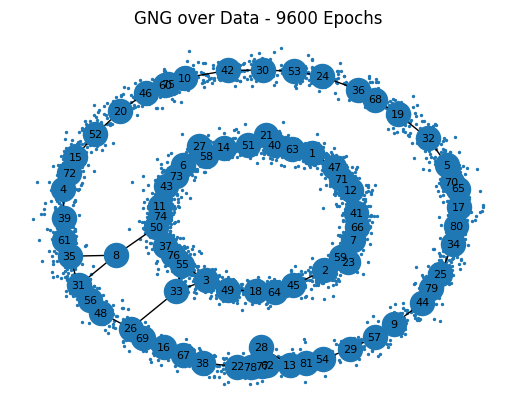

Node 82 added
New edge 82 - 5 added
Edge 31 - 48 removed
//////////



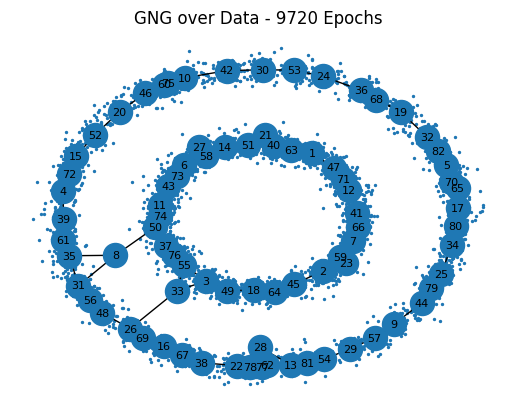

Node 83 added
New edge 55 - 83 added
New edge 32 - 82 added
New edge 3 - 83 added
//////////



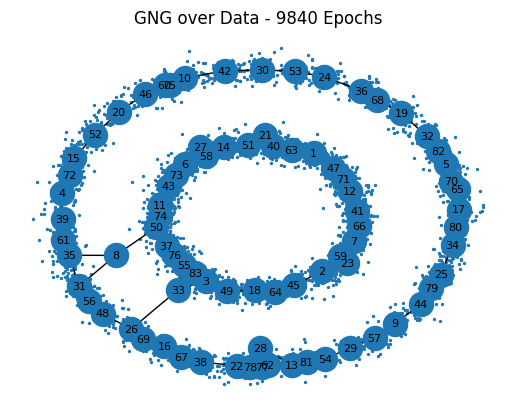

Node 84 added
New edge 84 - 72 added
New edge 78 - 77 added
//////////



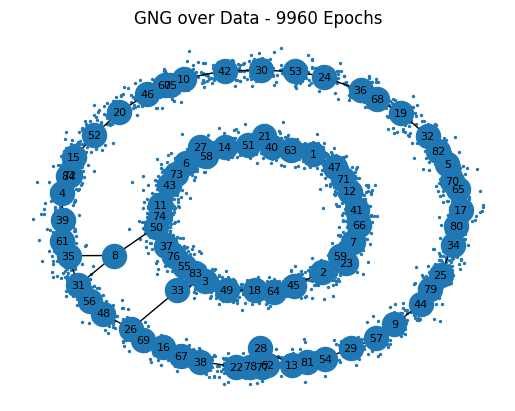

Node 85 added
New edge 85 - 80 added
New edge 34 - 85 added
New edge 4 - 84 added
Edge 47 - 12 removed
//////////



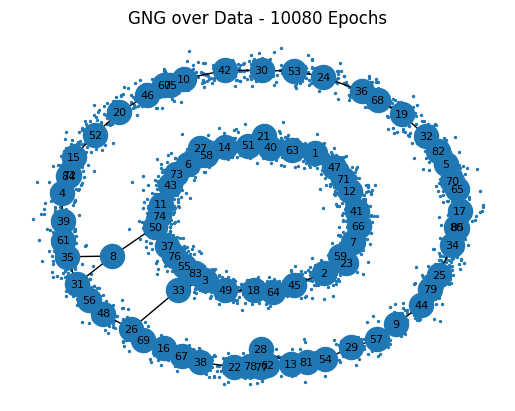

Node 86 added
New edge 44 - 86 added
Edge 46 - 10 removed
//////////



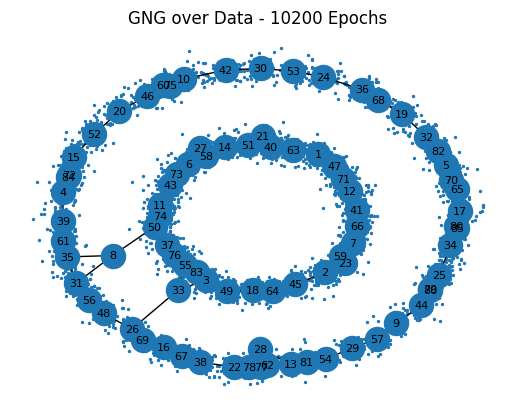

Node 87 added
New edge 87 - 35 added
New edge 87 - 8 added
New edge 17 - 85 added
//////////



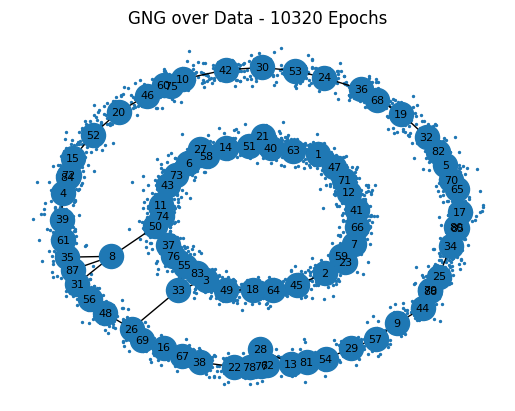

Node 88 added
New edge 31 - 87 added
Edge 39 - 35 removed
New edge 88 - 44 added
//////////



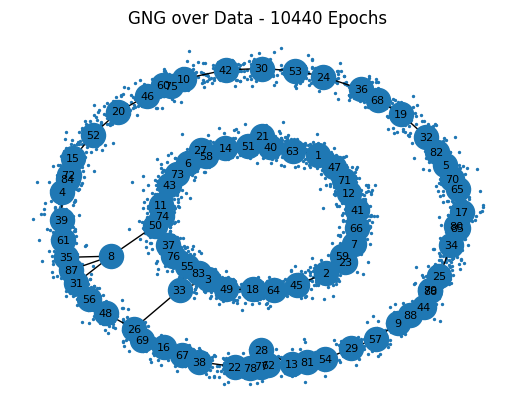

Node 89 added
New edge 89 - 73 added
New edge 79 - 86 added
New edge 88 - 9 added
New edge 46 - 75 added
Edge 4 - 15 removed
//////////



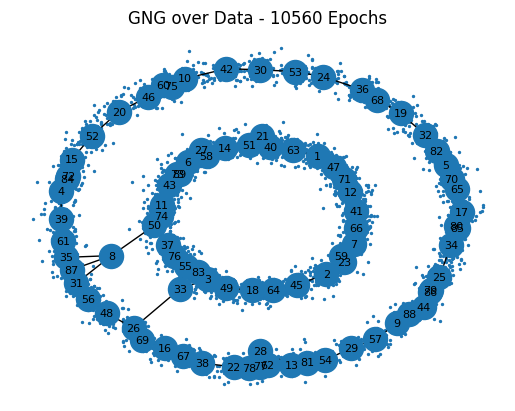

Node 90 added
New edge 90 - 42 added
New edge 6 - 89 added
New edge 76 - 33 added
New edge 30 - 90 added
Edge 11 - 50 removed
//////////



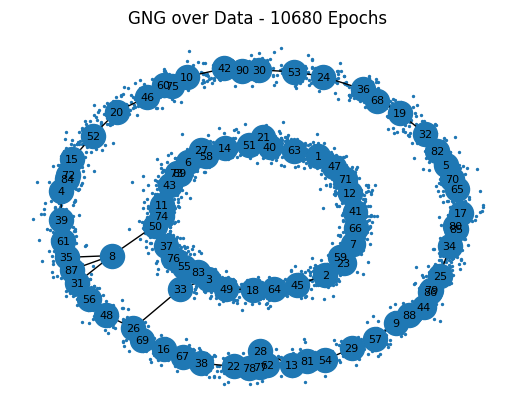

Node 91 added
New edge 33 - 83 added
New edge 90 - 91 added
//////////



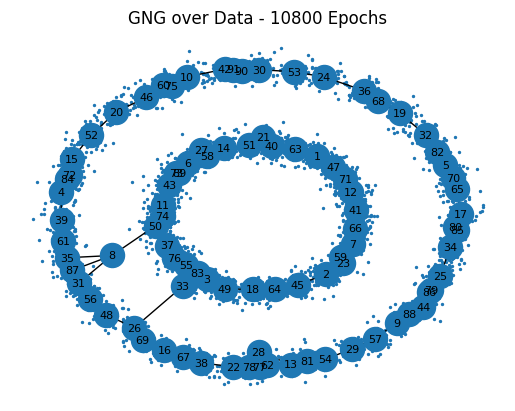

Node 92 added
New edge 42 - 91 added
//////////



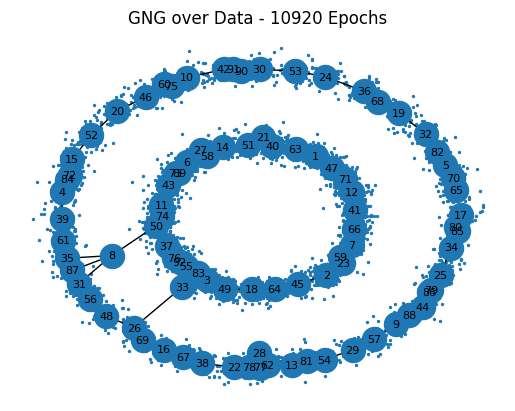

Node 93 added
New edge 63 - 93 added
Edge 26 - 33 removed
New edge 1 - 93 added
Edge 16 - 38 removed
New edge 28 - 77 added
//////////



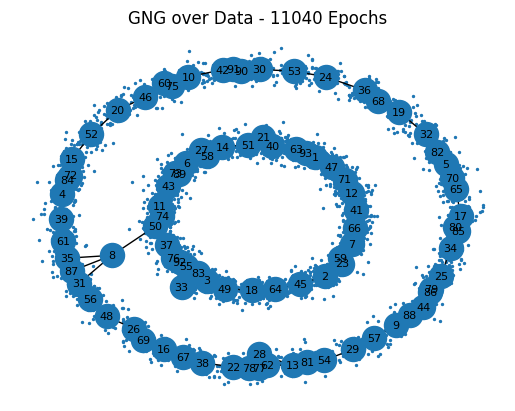

Node 94 added
New edge 94 - 20 added
New edge 43 - 89 added
New edge 92 - 55 added
New edge 76 - 92 added
Edge 65 - 5 removed
Edge 6 - 43 removed
//////////



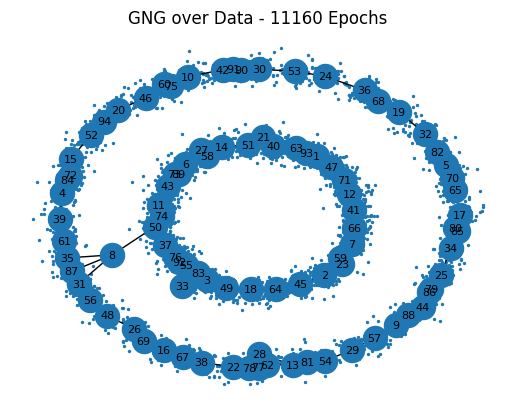

Node 95 added
New edge 95 - 41 added
Edge 55 - 37 removed
New edge 52 - 94 added
//////////



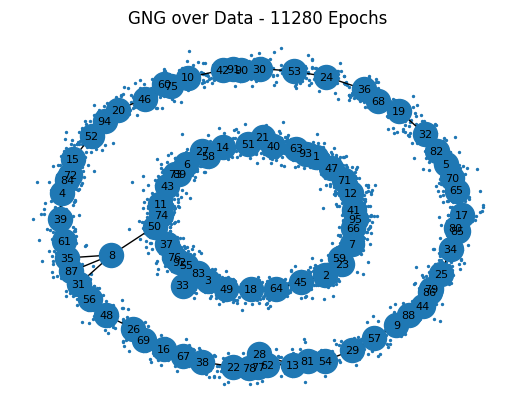

Node 96 added
New edge 96 - 11 added
New edge 96 - 43 added
Edge 36 - 19 removed
//////////



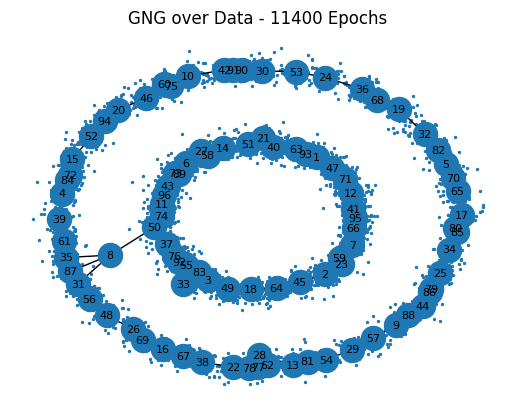

Node 97 added
New edge 95 - 66 added
New edge 42 - 97 added
New edge 97 - 10 added
//////////



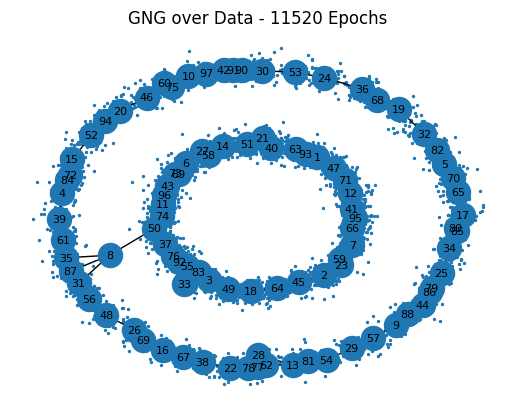

Node 98 added
New edge 50 - 98 added
New edge 98 - 74 added
Edge 26 - 16 removed
//////////



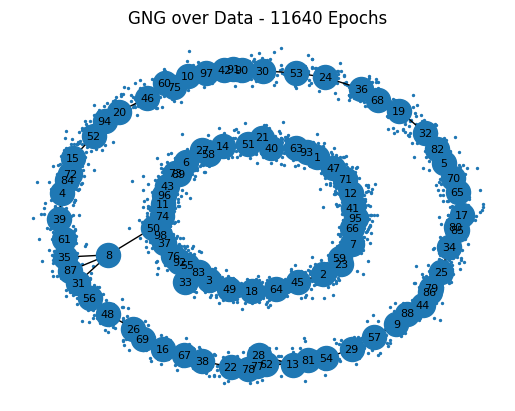

Node 99 added
New edge 50 - 99 added
Edge 17 - 34 removed
//////////



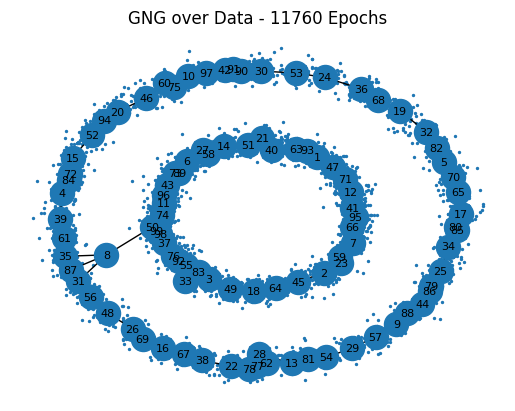

Node 100 added
New edge 21 - 100 added
New edge 40 - 100 added
New edge 37 - 98 added
//////////



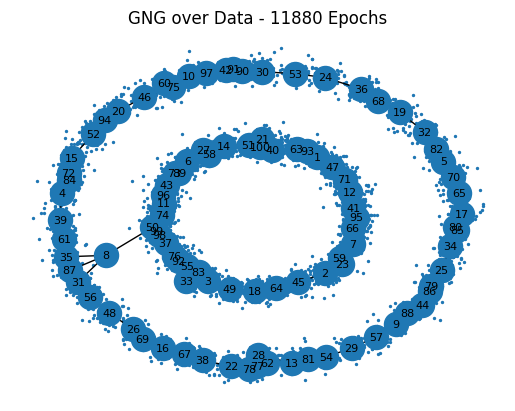

Node 101 added
New edge 83 - 101 added
New edge 100 - 51 added
New edge 33 - 101 added
New edge 99 - 98 added
//////////



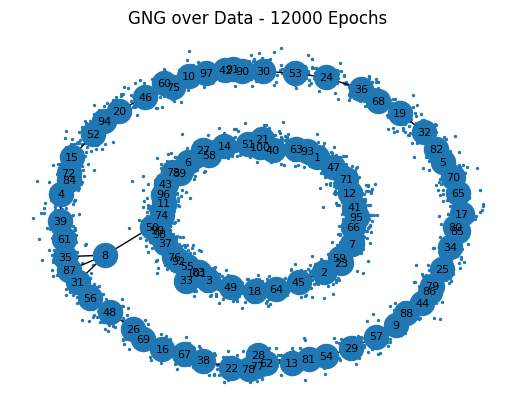

Node 102 added
New edge 74 - 99 added
New edge 3 - 101 added
//////////



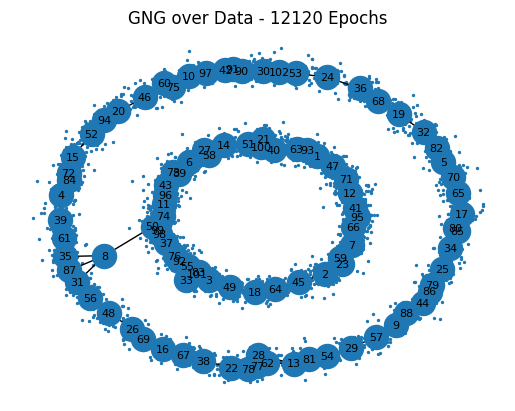

Node 103 added
New edge 30 - 102 added
New edge 103 - 23 added
New edge 2 - 103 added
//////////



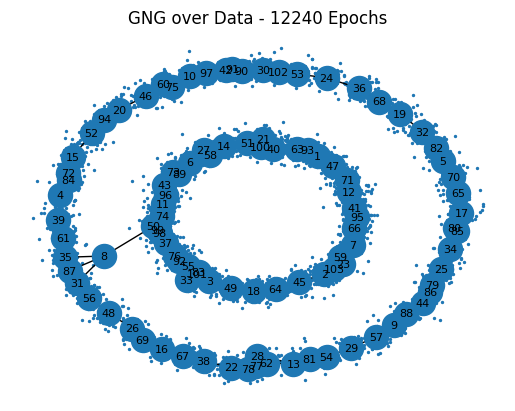

Node 104 added
New edge 19 - 104 added
Edge 3 - 55 removed
//////////



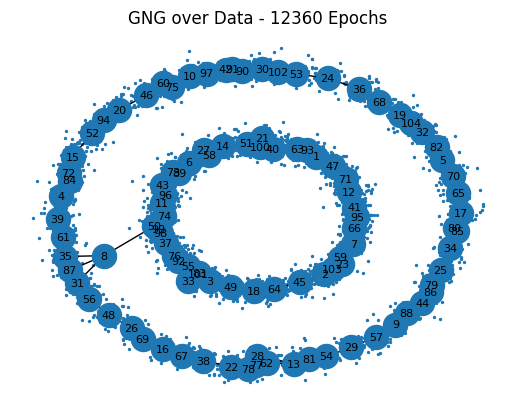

Node 105 added
New edge 105 - 43 added
New edge 96 - 105 added
New edge 53 - 102 added
//////////



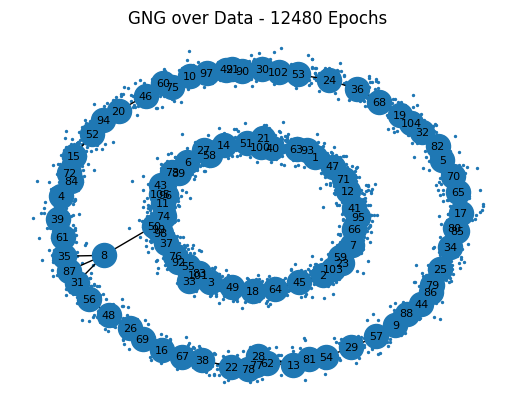

Node 106 added
New edge 11 - 105 added
New edge 48 - 106 added
//////////



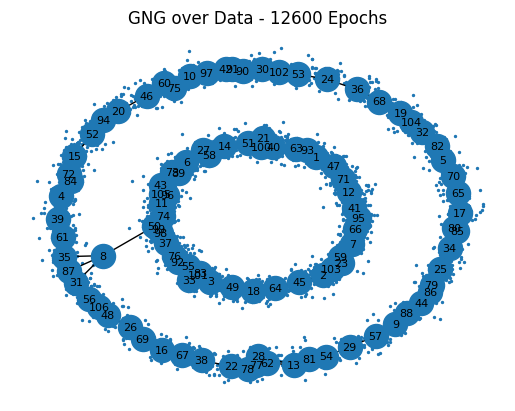

Node 107 added
New edge 19 - 107 added
Edge 13 - 28 removed
//////////



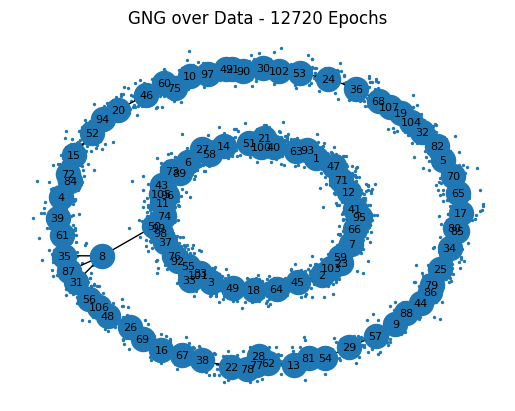

Node 108 added
New edge 45 - 108 added
New edge 56 - 106 added
New edge 64 - 108 added
New edge 104 - 32 added
Edge 7 - 23 removed
//////////



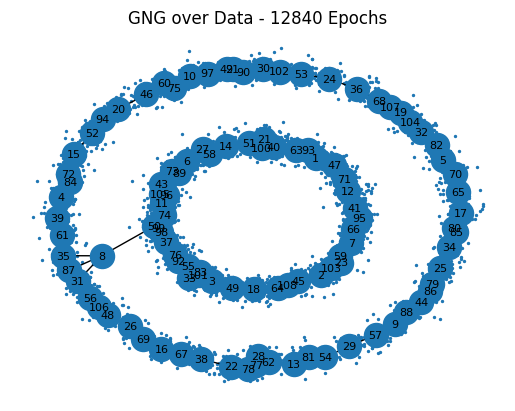

Node 109 added
New edge 45 - 109 added
Edge 44 - 25 removed
//////////



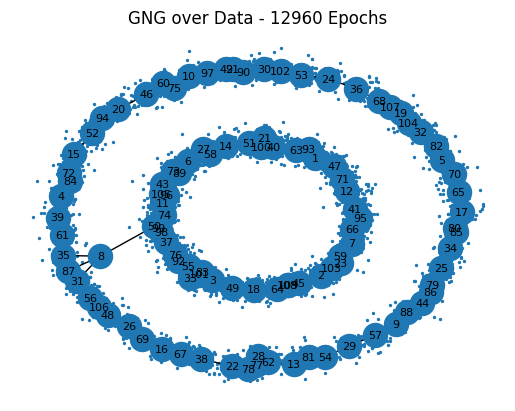

Node 110 added
New edge 68 - 107 added
//////////



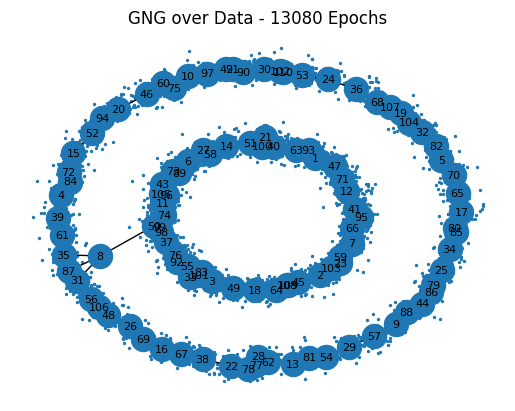

Node 111 added
Edge 54 - 13 removed
New edge 108 - 109 added
New edge 111 - 21 added
Edge 22 - 62 removed
//////////



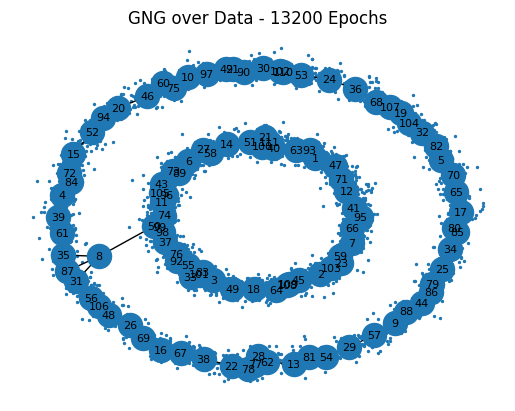

Node 112 added
New edge 64 - 112 added
New edge 111 - 40 added
New edge 112 - 108 added
//////////



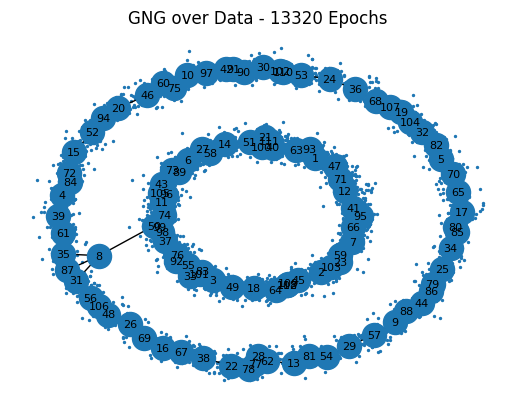

Node 113 added
Edge 4 - 72 removed
New edge 111 - 63 added
New edge 78 - 113 added
New edge 53 - 110 added
New edge 22 - 113 added
//////////



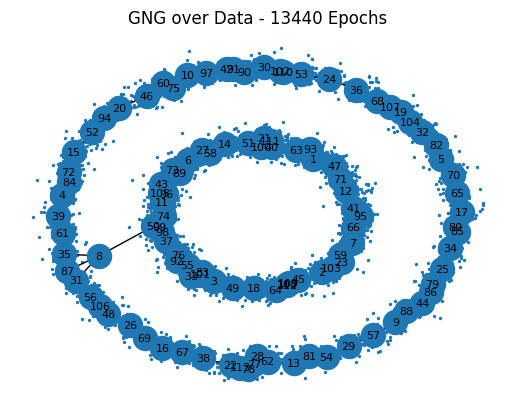

Node 114 added
New edge 65 - 114 added
New edge 17 - 114 added
Edge 52 - 20 removed
//////////



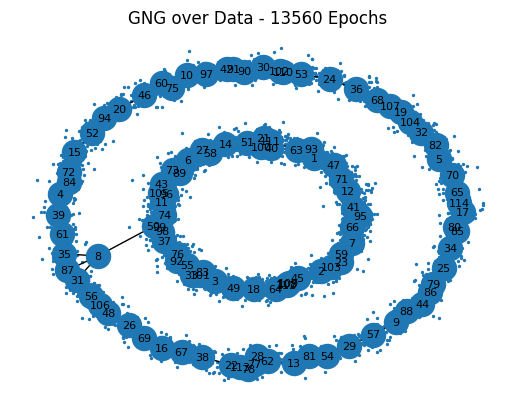

Node 115 added
New edge 115 - 15 added
New edge 52 - 115 added
Edge 32 - 5 removed
//////////



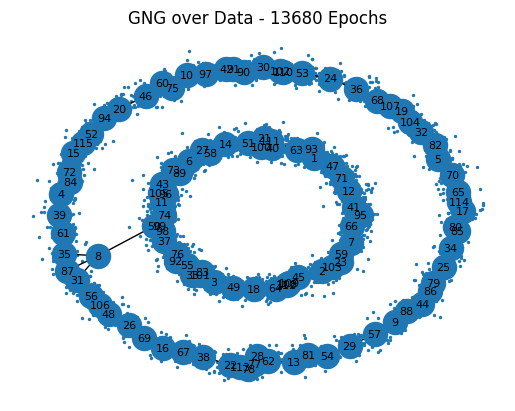

Node 116 added
New edge 20 - 116 added
Edge 41 - 66 removed
//////////



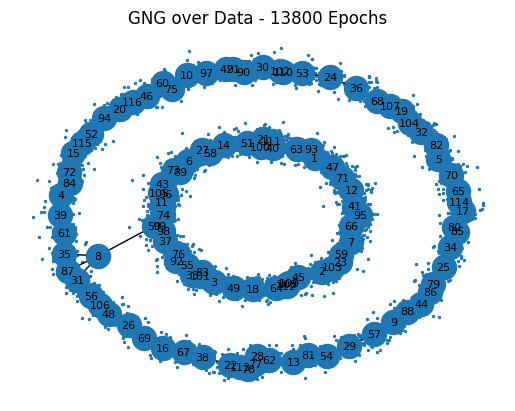

Node 117 added
New edge 71 - 117 added
New edge 12 - 117 added
New edge 102 - 110 added
New edge 116 - 46 added
New edge 8 - 61 added
//////////



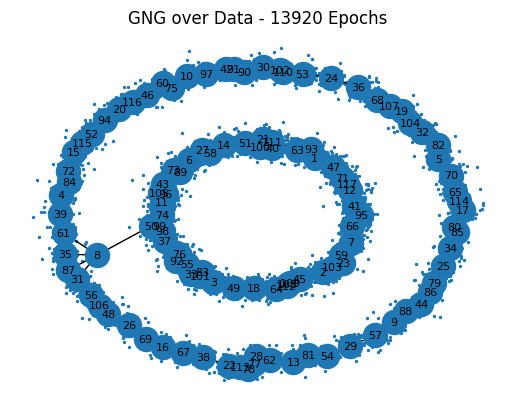

Node 118 added
New edge 23 - 118 added
Edge 35 - 8 removed
New edge 118 - 103 added
Edge 33 - 76 removed
//////////



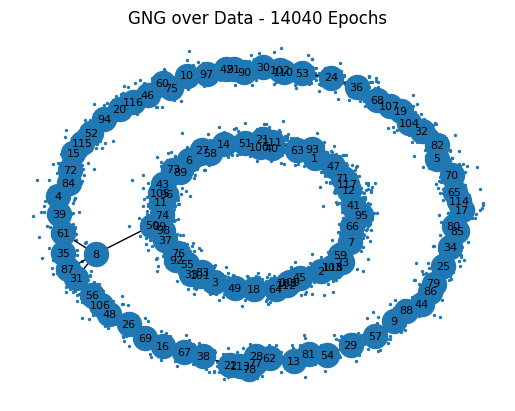

Node 119 added
New edge 39 - 119 added
Edge 34 - 80 removed
New edge 4 - 119 added
//////////



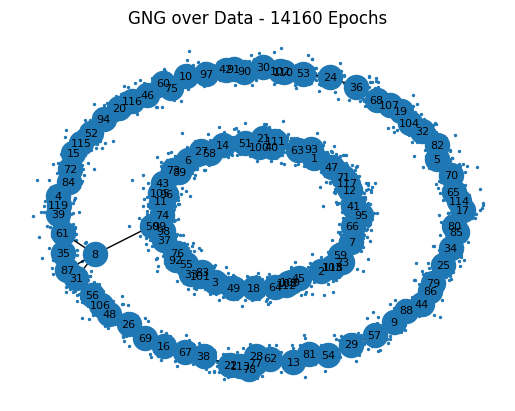

Node 120 added
New edge 29 - 120 added
//////////



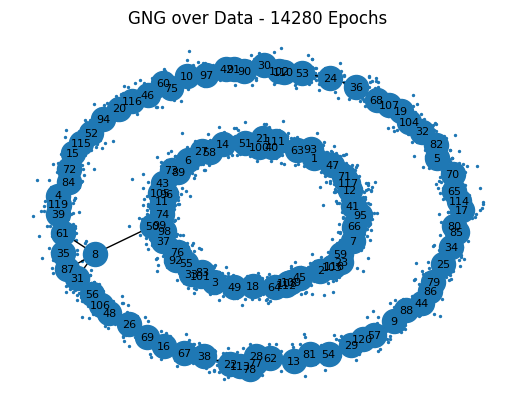

Node 121 added
Edge 2 - 23 removed
Edge 11 - 43 removed
//////////



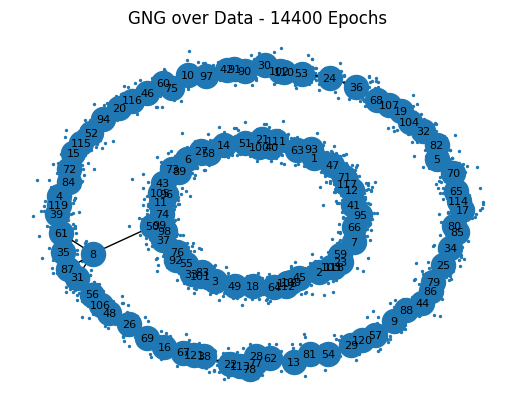

Node 122 added
Edge 51 - 40 removed
New edge 61 - 122 added
New edge 57 - 120 added
New edge 121 - 67 added
New edge 38 - 121 added
Edge 31 - 35 removed
Edge 2 - 59 removed
//////////



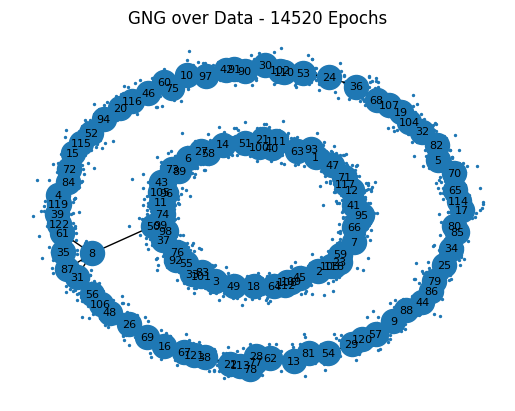

Node 123 added
New edge 123 - 65 added
New edge 70 - 123 added
//////////



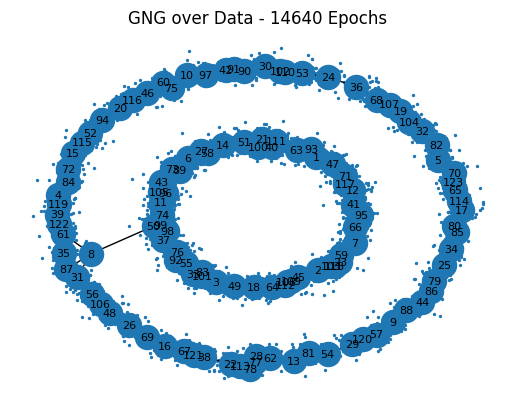

Node 124 added
New edge 122 - 39 added
New edge 18 - 124 added
New edge 124 - 64 added
//////////



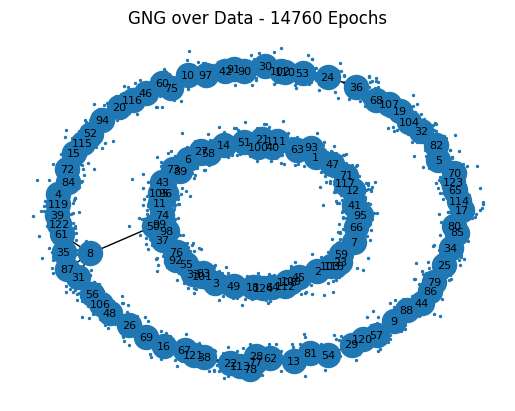

Node 125 added
Edge 85 - 17 removed
Edge 64 - 45 removed
//////////



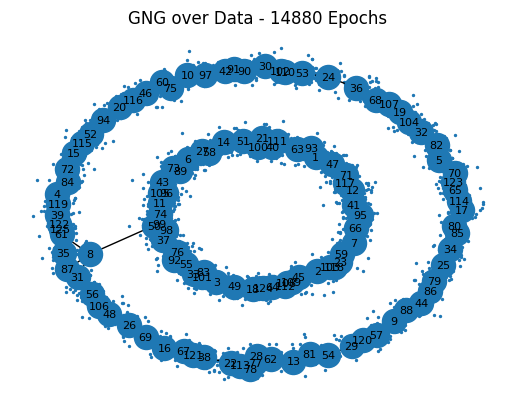

Node 126 added
New edge 51 - 126 added
Edge 8 - 50 removed
Edge 9 - 44 removed
New edge 109 - 112 added
New edge 14 - 126 added
//////////



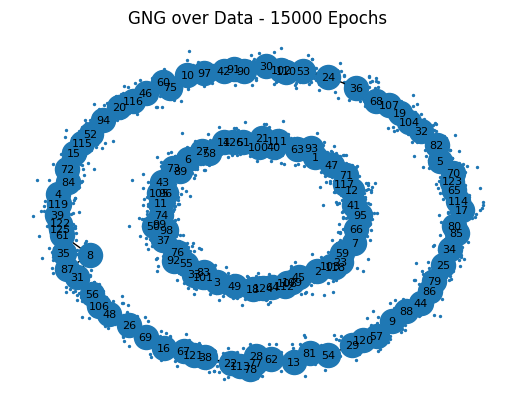

Node 127 added
New edge 125 - 61 added
New edge 122 - 125 added
Edge 30 - 42 removed
Edge 3 - 33 removed
New edge 24 - 127 added
//////////



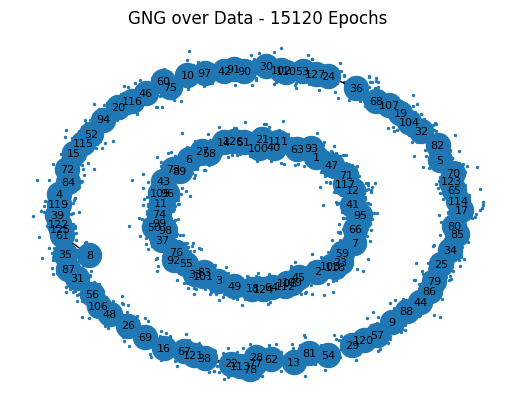

Node 128 added
New edge 13 - 128 added
New edge 127 - 53 added
Edge 22 - 77 removed
New edge 81 - 128 added
//////////



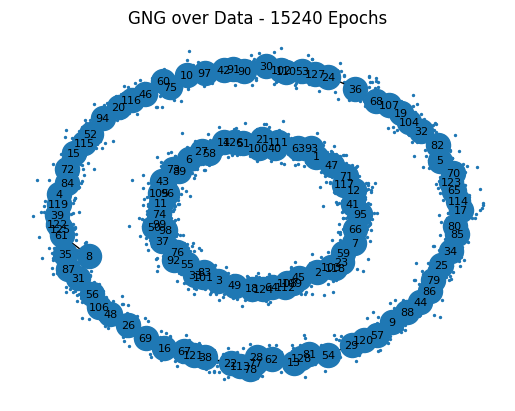

Node 129 added
New edge 13 - 129 added
New edge 8 - 35 added
New edge 62 - 129 added
//////////



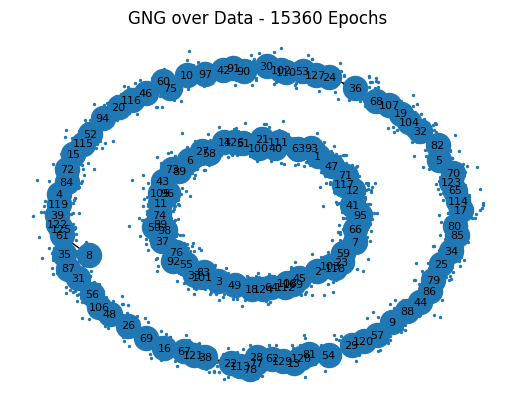

Node 130 added
Edge 79 - 44 removed
New edge 63 - 130 added
New edge 93 - 130 added
//////////



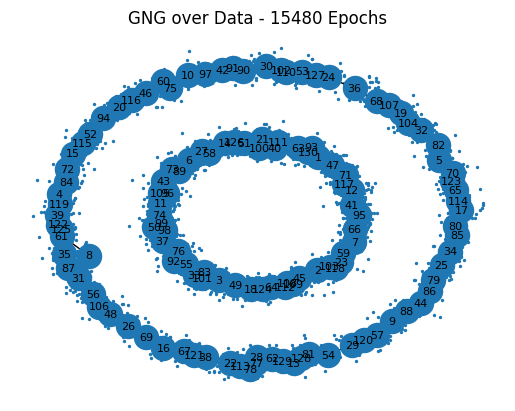

Node 131 added
New edge 7 - 131 added
New edge 1 - 130 added
//////////



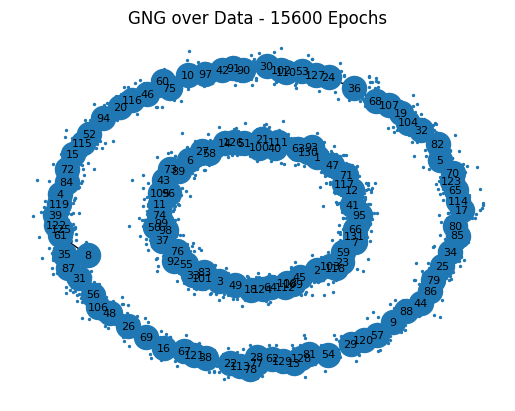

Node 132 added
New edge 132 - 73 added
New edge 131 - 66 added
//////////



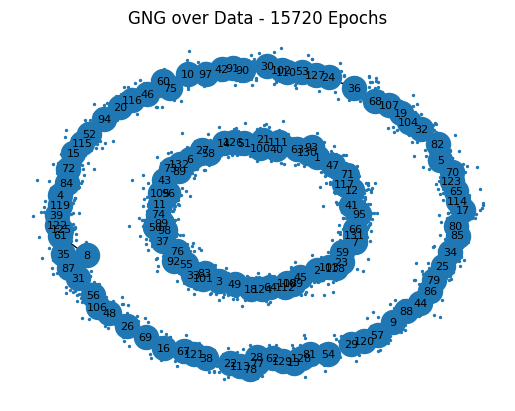

Node 133 added
Edge 98 - 74 removed
New edge 111 - 133 added
New edge 40 - 133 added
Edge 30 - 53 removed
//////////



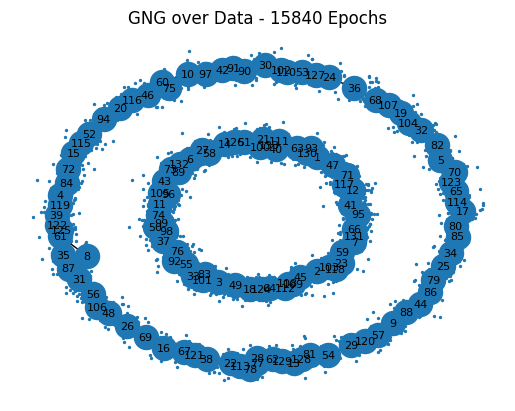

Node 134 added
New edge 5 - 134 added
New edge 132 - 6 added
New edge 21 - 133 added
//////////



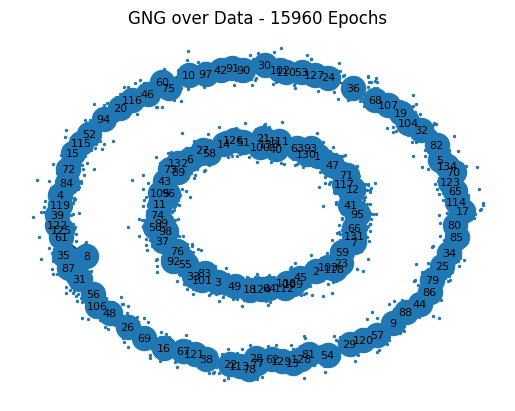

Node 135 added
New edge 135 - 51 added
New edge 70 - 134 added
//////////



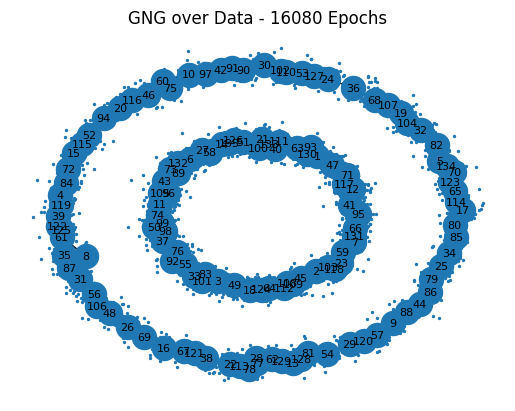

Node 136 added
New edge 14 - 135 added
New edge 136 - 127 added
//////////



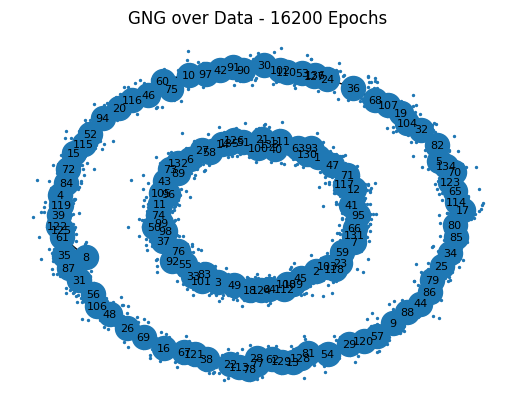

Node 137 added
New edge 137 - 12 added
New edge 41 - 137 added
New edge 89 - 132 added
//////////



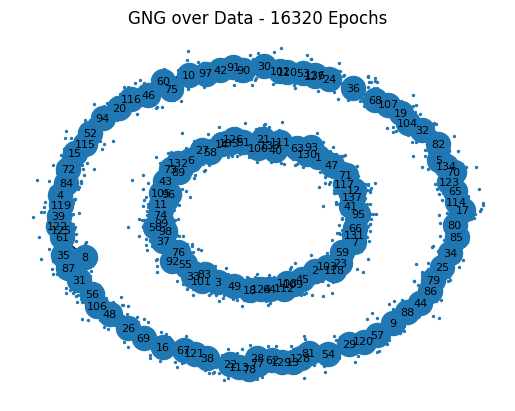

Node 138 added
New edge 126 - 135 added
Edge 32 - 19 removed
New edge 138 - 69 added
//////////



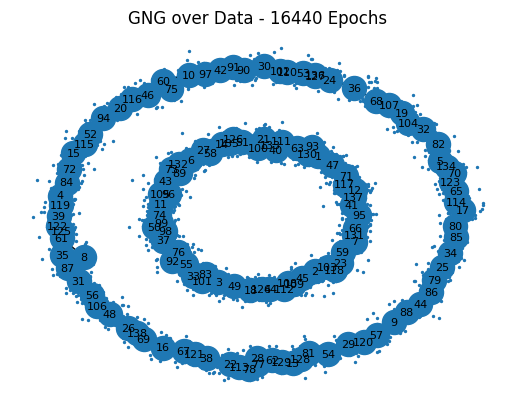

Node 139 added
Edge 19 - 68 removed
New edge 20 - 139 added
New edge 26 - 138 added
New edge 2 - 118 added
New edge 24 - 136 added
//////////



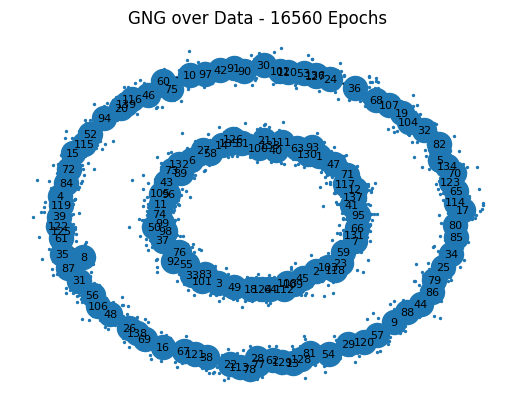

Node 140 added
New edge 35 - 140 added
New edge 61 - 140 added
New edge 80 - 114 added
New edge 116 - 139 added
New edge 136 - 53 added
//////////



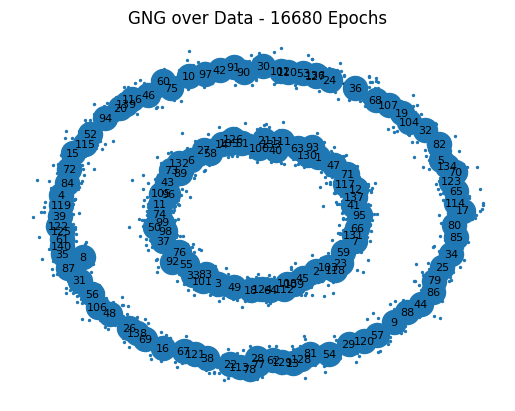

Node 141 added
New edge 141 - 30 added
New edge 47 - 117 added
New edge 100 - 133 added
New edge 90 - 141 added
//////////



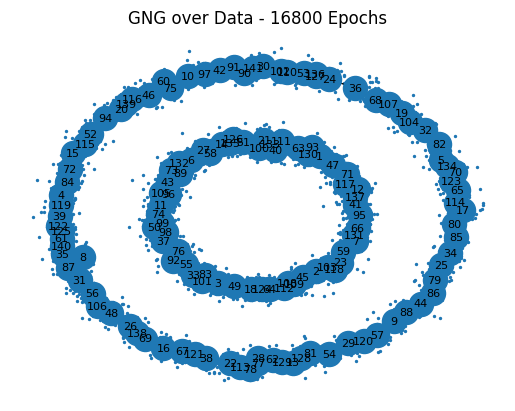

Node 142 added
Edge 56 - 48 removed
New edge 142 - 92 added
New edge 76 - 142 added
New edge 37 - 142 added
//////////



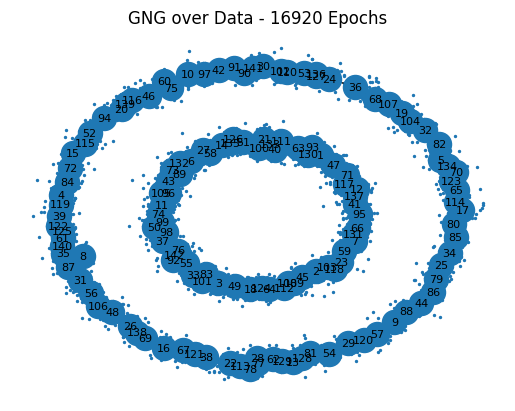

Node 143 added
Edge 42 - 90 removed
New edge 10 - 143 added
//////////



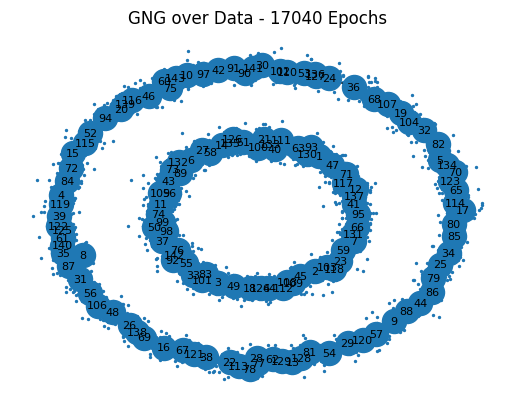

Node 144 added
New edge 17 - 144 added
New edge 114 - 144 added
//////////



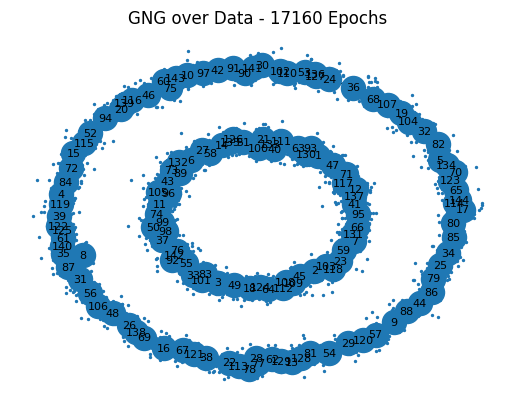

Node 145 added
New edge 143 - 60 added
New edge 2 - 109 added
New edge 144 - 65 added
//////////



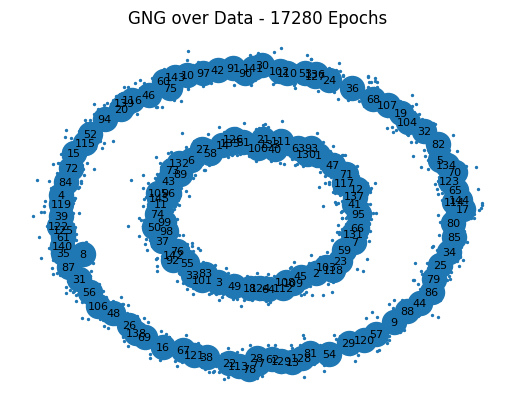

Node 146 added
New edge 45 - 146 added
Edge 46 - 20 removed
Edge 63 - 1 removed
//////////



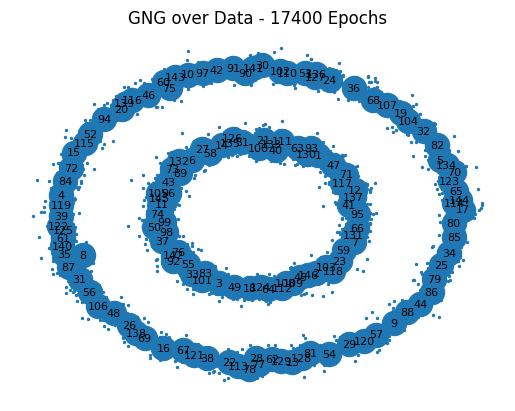

Node 147 added
New edge 146 - 2 added
New edge 147 - 95 added
New edge 96 - 145 added
New edge 11 - 145 added
//////////



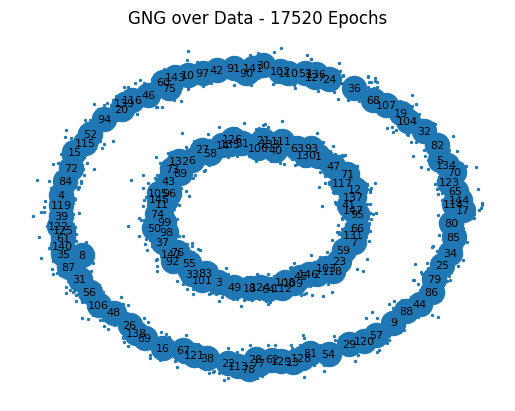

Node 148 added
New edge 41 - 147 added
New edge 103 - 146 added
//////////



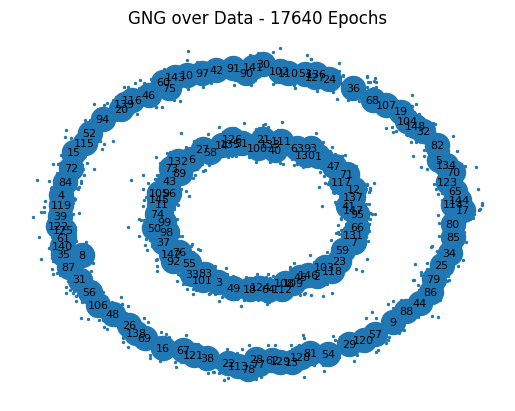

Node 149 added
New edge 105 - 145 added
New edge 28 - 113 added
New edge 2 - 149 added
New edge 148 - 32 added
//////////



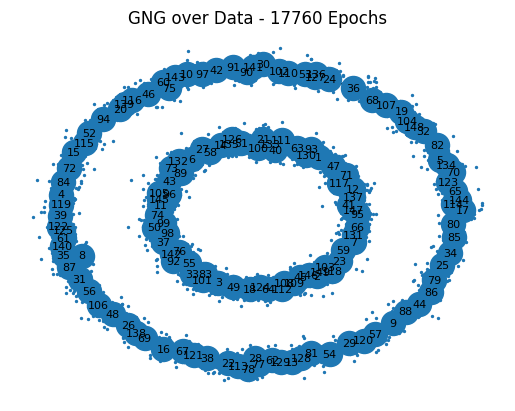

Node 150 added
New edge 150 - 47 added
New edge 118 - 149 added
New edge 71 - 150 added
New edge 149 - 103 added
//////////



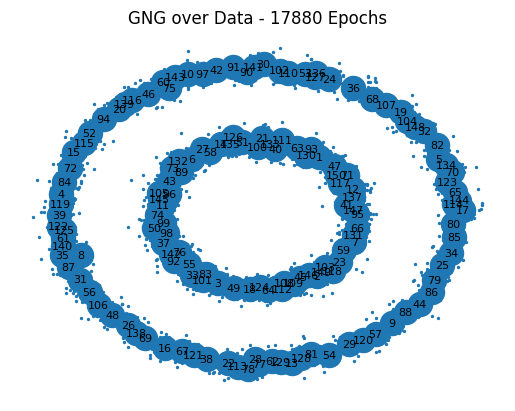

Node 151 added
New edge 137 - 147 added
New edge 117 - 150 added
Edge 40 - 21 removed
New edge 104 - 148 added
New edge 146 - 149 added
Edge 10 - 42 removed
//////////



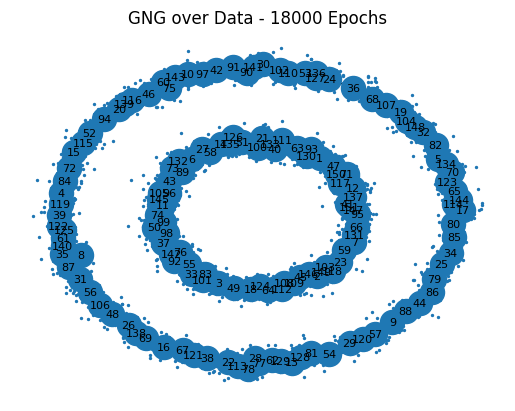

Node 152 added
New edge 8 - 140 added
New edge 41 - 151 added
New edge 151 - 147 added
Edge 14 - 51 removed
New edge 152 - 16 added
Edge 18 - 64 removed
//////////



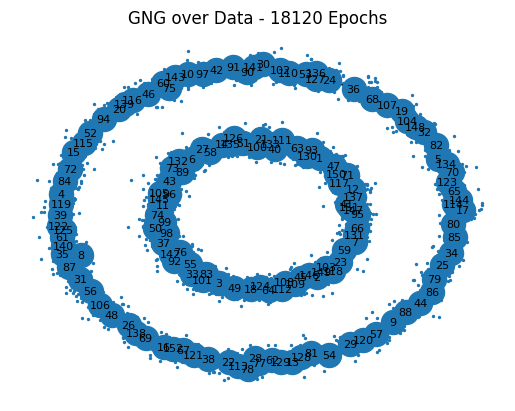

Node 153 added
New edge 46 - 153 added
Edge 6 - 73 removed
//////////



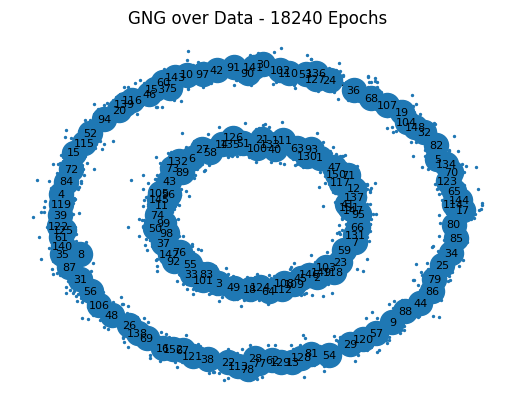

Node 154 added
New edge 67 - 152 added
New edge 86 - 154 added
New edge 75 - 153 added
Edge 24 - 53 removed
New edge 79 - 154 added
//////////



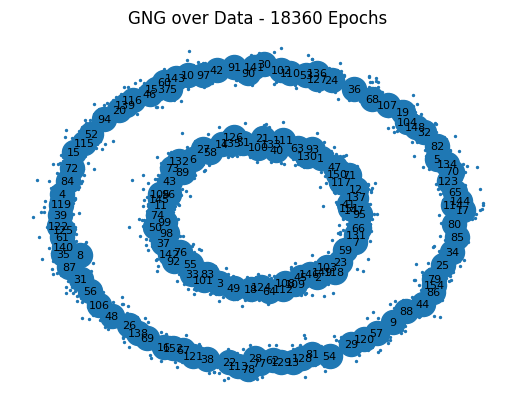

Node 155 added
New edge 117 - 41 added
//////////



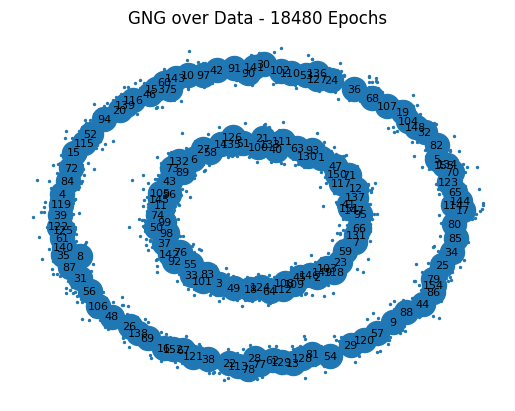

Node 156 added
New edge 5 - 155 added
New edge 156 - 106 added
//////////



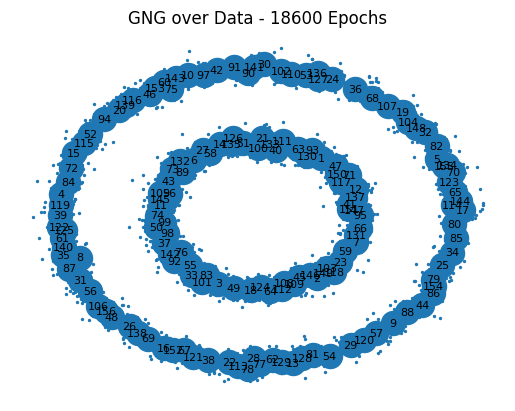

Node 157 added
New edge 155 - 134 added
New edge 48 - 156 added
Edge 17 - 65 removed
//////////



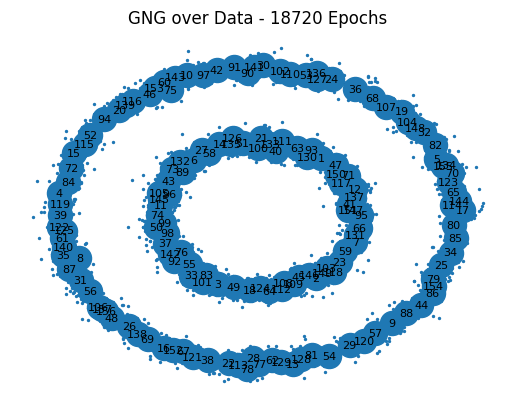

Node 158 added
New edge 124 - 108 added
New edge 60 - 153 added
New edge 4 - 158 added
New edge 156 - 157 added
//////////



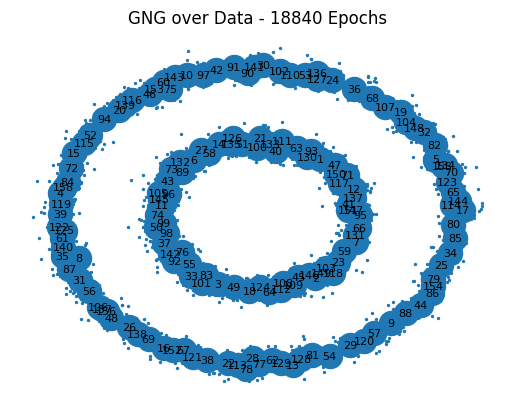

Node 159 added
New edge 84 - 158 added
New edge 128 - 159 added
New edge 13 - 159 added
//////////



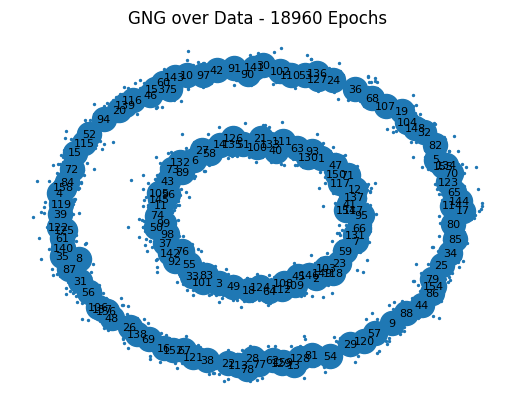

Node 160 added
New edge 115 - 160 added
New edge 62 - 159 added
New edge 134 - 82 added
Edge 15 - 52 removed
New edge 75 - 143 added
New edge 106 - 157 added
//////////



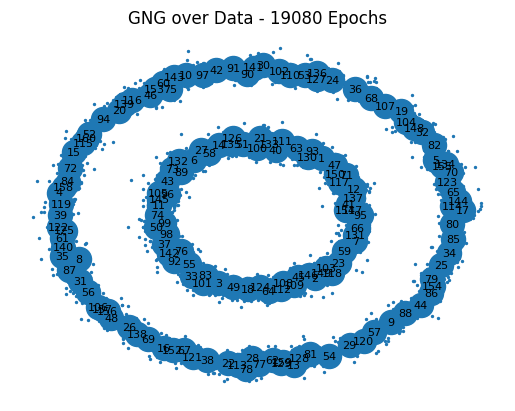

Node 161 added
New edge 52 - 160 added
//////////



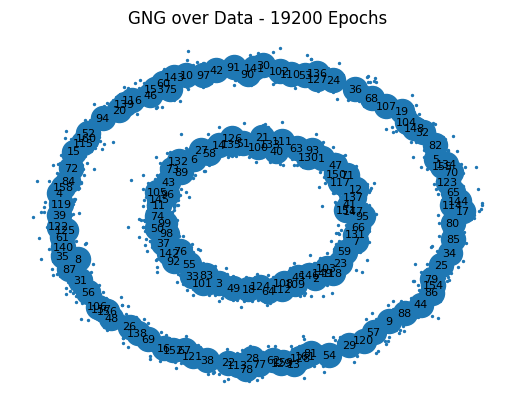

Node 162 added
Edge 29 - 57 removed
New edge 70 - 155 added
New edge 81 - 161 added
//////////



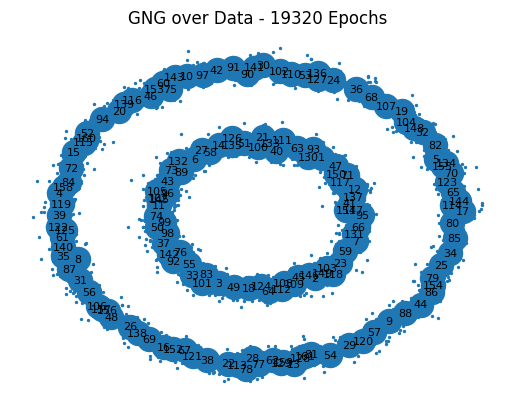

Node 163 added
New edge 94 - 163 added
New edge 105 - 162 added
//////////



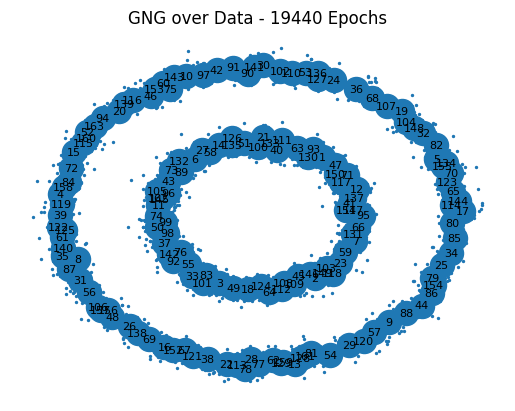

Node 164 added
Edge 4 - 39 removed
New edge 110 - 164 added
New edge 48 - 157 added
New edge 129 - 159 added
Edge 7 - 66 removed
New edge 52 - 163 added
//////////



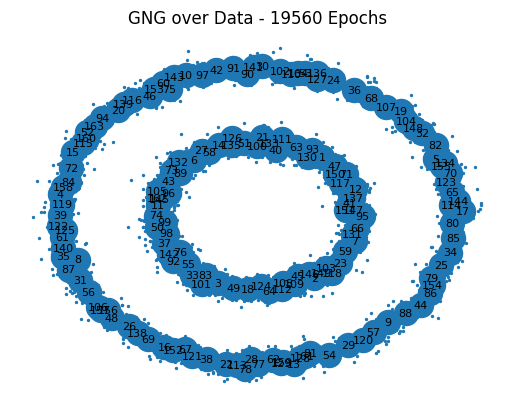

Node 165 added
New edge 165 - 49 added
New edge 161 - 128 added
New edge 18 - 165 added
New edge 164 - 53 added
Edge 67 - 38 removed
New edge 160 - 163 added
//////////



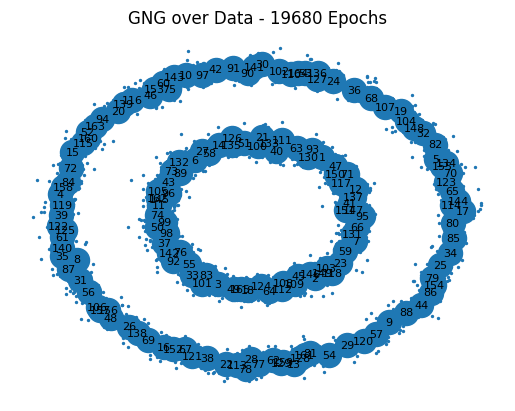

Node 166 added
New edge 120 - 166 added
New edge 117 - 137 added
New edge 162 - 145 added
Edge 41 - 12 removed
//////////



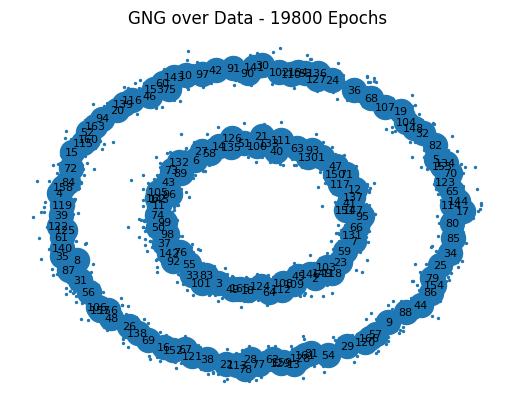

Node 167 added
Edge 39 - 61 removed
//////////



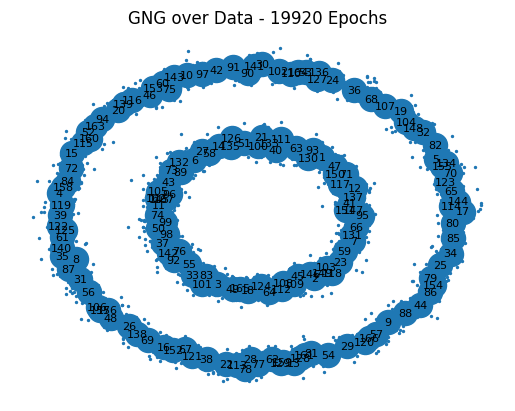

Node 168 added
New edge 18 - 64 added
New edge 96 - 167 added
Edge 53 - 102 removed
//////////



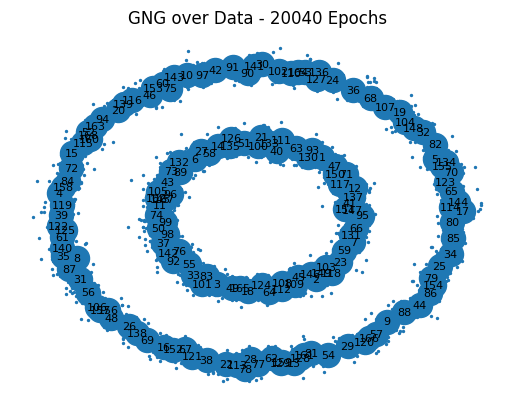

Node 169 added
New edge 57 - 166 added
New edge 109 - 169 added
New edge 91 - 141 added
New edge 167 - 11 added
//////////



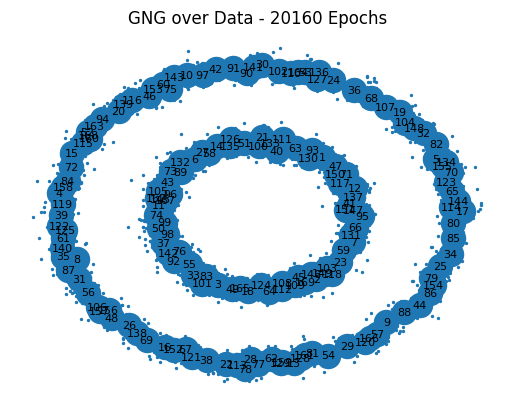

Node 170 added
New edge 63 - 170 added
New edge 170 - 111 added
Edge 22 - 78 removed
New edge 2 - 169 added
New edge 52 - 168 added
New edge 59 - 131 added
New edge 45 - 169 added
//////////



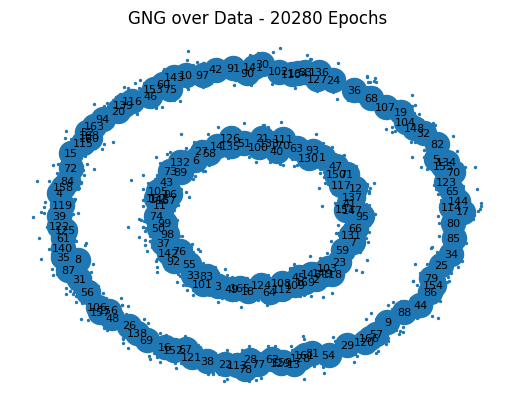

Node 171 added
New edge 11 - 162 added
//////////



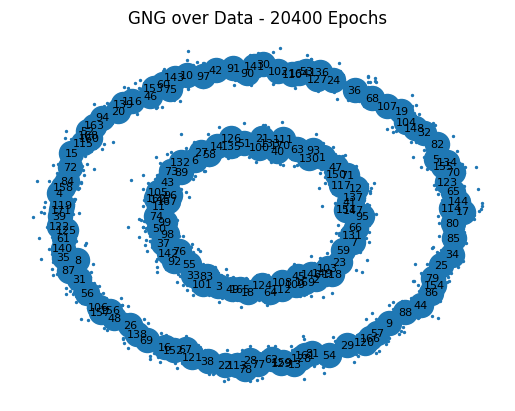

Node 172 added
New edge 22 - 172 added
New edge 39 - 171 added
New edge 113 - 172 added
//////////



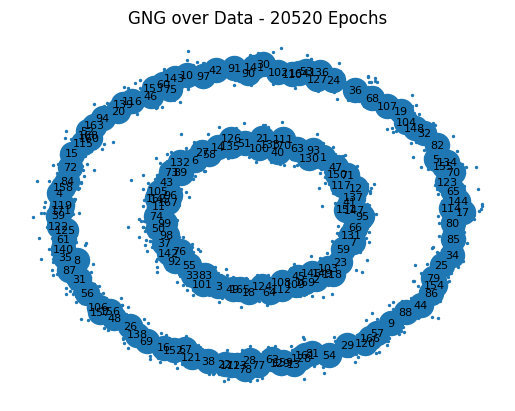

Node 173 added
New edge 40 - 170 added
New edge 9 - 173 added
New edge 119 - 171 added
Edge 70 - 5 removed
Edge 65 - 70 removed
//////////



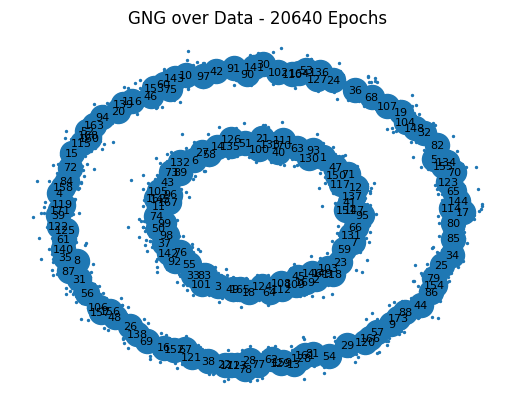

Node 174 added
New edge 127 - 164 added
New edge 160 - 168 added
//////////



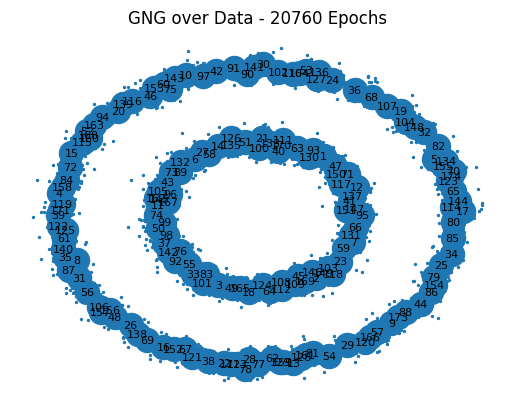

Node 175 added
New edge 173 - 88 added
New edge 33 - 175 added
New edge 165 - 124 added
New edge 175 - 83 added
New edge 55 - 175 added
//////////



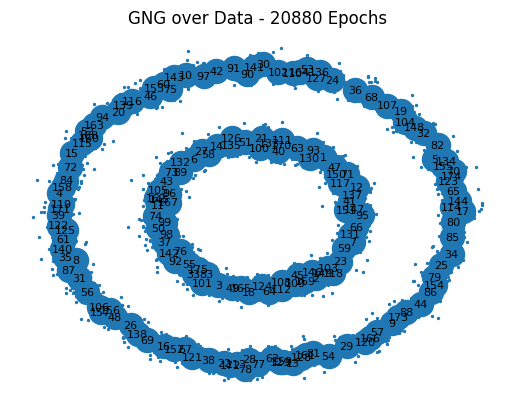

Node 176 added
New edge 176 - 43 added
New edge 70 - 174 added
Edge 47 - 117 removed
//////////



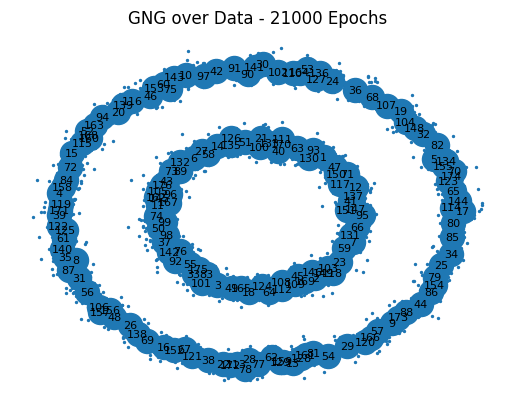

Node 177 added
New edge 123 - 174 added
//////////



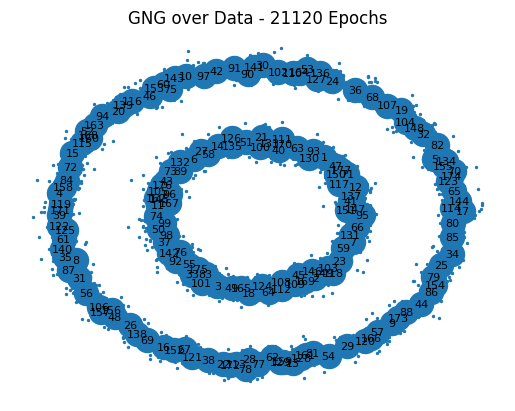

Node 178 added
New edge 47 - 177 added
New edge 96 - 176 added
New edge 105 - 176 added
Edge 28 - 78 removed
//////////



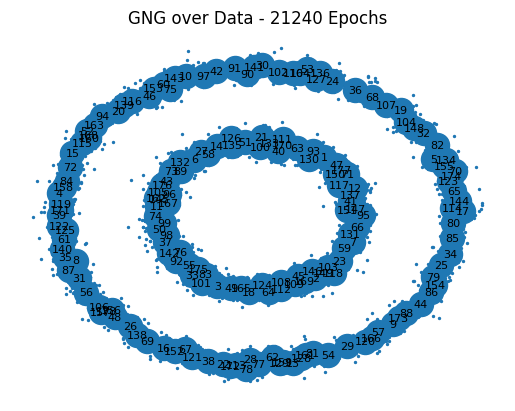

Node 179 added
New edge 177 - 71 added
New edge 89 - 179 added
New edge 150 - 177 added
New edge 48 - 178 added
//////////



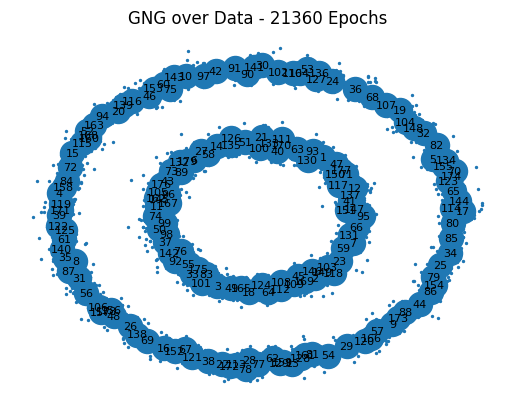

Node 180 added
New edge 6 - 179 added
New edge 130 - 180 added
New edge 93 - 180 added
New edge 156 - 178 added
//////////



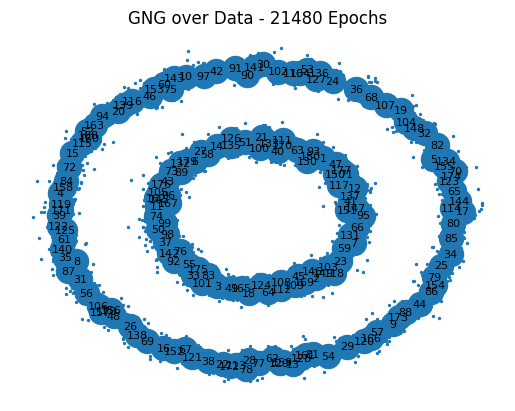

Node 181 added
Training ended


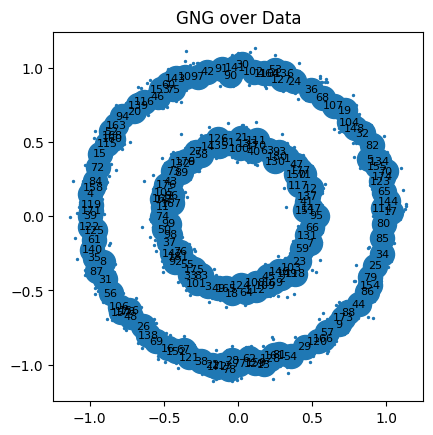

In [387]:
G = nx.Graph()

# Cria neuronios em posicoes aleatorias, comeca com 2

G.add_node(1, pos=[0, 0], erro=0)
G.add_node(2, pos=[1, 0], erro=0)

epoch = 0

while G.order() <= max_nodes:

    # Seleciona um ponto aleatorio nos dados
    pos = np.random.randint(X.shape[0])

    dot = X[pos]

    distances = calc_distance_from_nodes(dot)
    best_neurons = [n for n, _ in distances[:2]]

    # Atualiza o peso do neuronio e dos vizinhos
    first = best_neurons[0]
    second = best_neurons[1]

    update_peso(first, dot)
    update_neighbors(first, dot)

    # Adiciona arestas se necessario, aumenta a idade da arestas do vencedor, remove arestas velhas e nodes isolados
    _add_edge(first, second, idade = 0)

    # Decay
    reduce_all_errors()

    # EPOCH
    epoch += 1

    # Adiciona um neuronio entre os neuronios com mais erro, a cada 120 epochs
    if epoch % lambda_steps == 0:

        print("/" * 10)
        print("")

        plot_over_data(G, X, epoch)

        adiciona_neuron()

print("Training ended")

# print(G)

plot_over_data(G, X)